In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib widget
import ssm
import copy
from tqdm import tqdm
import pickle 
import matplotlib.gridspec as gridspec
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, leaves_list, dendrogram, fcluster
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display
from ssm.util import random_rotation, find_permutation
from ipywidgets import interact, IntSlider
import sys
import glob
sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')
from collections import defaultdict
import random 
from scipy.ndimage import gaussian_filter1d
from get_data.read_neuro_beh_data import get_exp_features, load_json
from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
from beh_classification.behavior_features import get_behavior_features
from beh_classification.get_behavior_classifications import get_behavior_classification
from beh_classification.beh_classification_utils import get_start_end_is_of_ones_in_binary_array
import socket
import sklearn
from sklearn.cross_decomposition import CCA
from sklearn.utils import shuffle
import os
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score
from sklearn import svm
from matplotlib.gridspec import GridSpec
from sklearn.svm import LinearSVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from tqdm import tqdm
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors

import torch
import torch.nn as nn
import torch.optim as optim

def smooth_trace(raw_trace, sigma = 2):
    denoised_data = gaussian_filter1d(raw_trace, sigma=sigma)
    return denoised_data

def shift_array_by_one(array):
    _, n_dim = array.shape
    tmp = np.ones((T, n_dim))*np.nan
    tmp[1:] = array
    array = tmp
    return array


def load_all_data():
    # this just returns lists of traces, neural labels, and behavior for each worm
    # Also includes dtrace
    # be warned that all elements of the list have different shapes

    host = socket.gethostname()[0:6]
    if host == 'Bennet' or host == 'bennet' or 'northwestern' in socket.gethostname():
        json_dir = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/Neuropal_no_heat/"
        h5_dir = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/processed_h5/"
    else:
        json_dir = "/Users/friederikebuck/Desktop/MBL/project/data/Neuropal_no_heat/"
        h5_dir ="/Users/friederikebuck/Desktop/MBL/project/data/processed_h5/"


    directories = glob.glob(json_dir+"*.json") #get filename/paths of all the json files
    exp_dates = [directory.split("/")[-1].split(".")[0] for directory in directories] #extract the exp_dates
    for i in range(len(exp_dates)):
        print("Worm {}, date: {}".format(i, exp_dates[i]))

    full_traces = []
    full_neural_labels = []
    full_beh_classification = []
    full_beh_data = []

    for exp_date in exp_dates:
        dt, T, beh_data, neural_data, neuroID_to_key = get_exp_features(exp_date, 
                                                                    json_dir = json_dir, 
                                                                    h5_dir = h5_dir)
        behavior_features = get_behavior_features(beh_data)
        beh_data.update(behavior_features)
        behavior_classification = get_behavior_classification(beh_data)

        beh_data_dir = f"/Users/bennetsakelaris/Desktop/behavior/outputs_sparse/{exp_date}/csvs1/"
        csv_name = os.path.join(beh_data_dir, "beh_confocal.csv")
        beh_confocal = np.loadtxt(csv_name, delimiter=",")
        z_beh = beh_confocal
        
        behavior_classification = {
        "is_fwd": beh_confocal==0, 
        "is_rev": beh_confocal==1, 
        "is_turn": beh_confocal==2, 
        "is_pause":  beh_confocal==3,
        }

        neural_labels_orig, ftrace = get_neural_activity_and_labels(neural_data,  denoised = True)

        dtrace = get_derivative_of_neural_activity(smooth_trace(ftrace.T,sigma=5).T, dframes = 1)
        dtrace -= np.mean(dtrace,axis=0)
        dtrace /= np.std(dtrace,axis=0)
        traces = np.concatenate([ftrace[1:,: ],dtrace ], axis =1)
        neural_labels = np.array(["F - "+ lbl[0] for lbl in neural_labels_orig]+
                                ["dF - "+ lbl[0] for lbl in neural_labels_orig])
        
        full_traces.append(traces)
        full_neural_labels.append(neural_labels)
        full_beh_classification.append(behavior_classification)
        full_beh_data.append(beh_data)

    return full_traces, full_neural_labels, full_beh_classification, full_beh_data
        


def load_all_data_but_pretend_its_all_one_worm():
    # This function concatenates everything into one worm and also returns a mask that tells you which neurons are and arent present
    # Thing to ponder: adding columns of NaNs between worms would probably help the rSLDS learn better
    full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()

    #get list of all neurons recorded in at least one trial
    neural_labels_set = set()
    for nl in full_neural_labels:
        neural_labels_set = neural_labels_set.union(set(nl))
    neural_labels = np.sort(list(neural_labels_set))

    #now make the traces array, where the different recordings are concatenated and matched by neuron
    #note: a couple of worms have 15 extra timesteps. I am truncating those to make things easier down the line
    T = 1599
    traces = np.zeros((T*len(full_traces), neural_labels.shape[0]))*np.nan #initialize traces to nan 
    #build the traces matrix
    w=0
    for tr, labels, in zip(full_traces, full_neural_labels): #for each worm, w
        for i in range(tr.shape[1]): #for each neuron, i
            label = labels[i] #get neuron name
            idx = np.where(neural_labels==label)[0][0] #get index in full array
            traces[w*T:(w+1)*T, idx] = tr[0:T,i] #put the neuron's activity in the appropriate spot
        w+=1 #update worm index

    

    #set up behavior classification dict
    behavior_classification = dict()
    behavior_classification["is_turn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_pause"] = np.zeros(T*len(full_traces))
    behavior_classification["is_rev"] = np.zeros(T*len(full_traces))
    behavior_classification["is_fwd"] = np.zeros(T*len(full_traces))
    behavior_classification["is_revturn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_purerev"] = np.zeros(T*len(full_traces))
    behavior_classification["is_pureturn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_rev_of_rev_turn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_turn_of_rev_turn"] = np.zeros(T*len(full_traces))

    #fill it in
    w=0
    for bc in full_beh_classification:
        for key in bc.keys():
            behavior_classification[key][w*T:(w+1)*T] = bc[key][1:(T+1)] # shifting by one bc of the trace
        w+=1 #update worm index

    #return mask of nan data
    mask =  (~np.isnan(traces)).astype(int)
    return traces, neural_labels, behavior_classification, mask

# removes neurons that were only recorded in fewer than [threshold] experiments
def remove_rare_neurons(traces, neural_labels, mask, threshold=10): 
    n_occurances = np.zeros(traces.shape[1]) #count the number of occurances for each neuron
    for n in np.arange(0, traces.shape[1]):
        n_occurances[n] = sum(~np.isnan(traces[np.arange(100, traces.shape[0], 1599),n]))
    print("Removing {} neurons that are not recorded in more than {} experiments".format(sum(n_occurances<=threshold)/2, threshold))
    print("{} neurons remaining".format(sum(n_occurances>threshold)/2))
    
    traces = traces[:, n_occurances>threshold]
    neural_labels = neural_labels[n_occurances>threshold]
    mask = mask[:, n_occurances>threshold]
    return traces, neural_labels, mask


from matplotlib.colors import LinearSegmentedColormap

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
           "lightblue", # reverse
           "darkgreen", # turn
           "purple","red", "yellow", "black", "pink"]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))

def states_to_changepoints(z):
    assert z.ndim == 1
    z = np.array(z)
    return np.concatenate(([0], 1 + np.where(np.diff(z))[0], [z.size - 1]))

def plot_2d_continuous_states(x, z,
                              colors=palette,
                              ax=None,
                              inds=(0,1),
                              figsize=(2.5, 2.5),
                              **kwargs):

    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111)

    cps = states_to_changepoints(z)

    # Color denotes our inferred latent discrete state
    for cp_start, cp_stop in zip(cps[:-1], cps[1:]):
        ax.plot(x[cp_start:cp_stop + 1, inds[0]],
                x[cp_start:cp_stop + 1, inds[1]],
                 '-', color=colors[z[cp_start]],
                **kwargs)

def plot_dynamic_landscape(model,k,
    xlim=(-4, 4), ylim=(-3, 3), nxpts=20, nypts=20,
    alpha=0.3, ax=None, figsize=(3, 3), color=None):
    assert model.D == 2
    K = model.K
    x = np.linspace(*xlim, nxpts)
    y = np.linspace(*ylim, nypts)
    X, Y = np.meshgrid(x, y)
    xy = np.column_stack((X.ravel(), Y.ravel()))

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

    dxydt_m = xy.dot(model.dynamics.As[k].T) + model.dynamics.bs[k] - xy
    dxydt_m_norm = np.zeros((len(dxydt_m)))
    for xt in range(len(dxydt_m_norm)):
        dxydt_m_norm[xt] = np.linalg.norm(dxydt_m[xt,:])

    ax.plot_trisurf(xy[:,0], xy[:,1], dxydt_m_norm, cmap = "coolwarm", linewidth=0, antialiased=False)

    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()

    return ax

def plot_most_likely_dynamics(model, test_x, test_z, pca_x, other_pcs = False, input_str=0, input_id=0, ax=None, lim = None, plot_trajectory=True, inds=(0,1), do_pca=True, velocity=False):
    ind1,ind2 = inds
    pca = PCA(n_components=pca_x.shape[1])
    x_centered = pca_x - np.mean(pca_x, axis=0)
    pca.fit(x_centered)  # X is your trajectory data matrix
    X_pca = pca.transform(test_x - np.mean(pca_x, axis=0) )
    
    K = model.K
    # Define grid limits based on PCA-transformed trajectory
    if lim == None:
        x_min, x_max = X_pca[:, ind1].min() - 3, X_pca[:, ind1].max() + 3
        y_min, y_max = X_pca[:, ind2].min() - 3, X_pca[:, ind2].max() + 3
        lim = [x_min, x_max, y_min, y_max]
    else:
        x_min = lim[0]
        x_max = lim[1]
        y_min = lim[2]
        y_max = lim[3]

    # Create a grid of points
    x = np.linspace(x_min, x_max, 30)  # 30 grid points along x-axis
    y = np.linspace(y_min, y_max, 30)  # 30 grid points along y-axis
    X_grid, Y_grid = np.meshgrid(x, y)  # Create the grid

    # Inverse transform to get high-dimensional coordinates of grid points
    xy = np.column_stack(pca_x.shape[1]*[0*Y_grid.ravel()])
    xy[:,ind1] = X_grid.ravel()
    xy[:,ind2] = Y_grid.ravel()

    if (np.abs(input_str) > 0) and other_pcs:
        for i in range(xy.shape[1]):
            if (i != ind2) and (i!= ind1):
                xy[:,i] = X_pca[:,i].mean() + 0*Y_grid.ravel()

    if do_pca:
        xy_high_dim = pca.inverse_transform(xy)  # Map back to original space
    else:
        xy_high_dim = xy

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig = plt.figure()
        ax = fig.add_subplot(111)

    velocity_magnitudes = np.zeros_like(X_grid.ravel())

    if model.M == 0:
        for k, (A, b) in enumerate(zip(model.dynamics.As, model.dynamics.bs)):
            next_step_high_dim = xy_high_dim @ A.T + b  # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
            velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
    else:
        for k, (A, b, V) in enumerate(zip(model.dynamics.As, model.dynamics.bs, model.dynamics.Vs)):
            next_step_high_dim = xy_high_dim @ A.T + b + input_str*V[:,input_id] # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
                velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
            
    if velocity:
        ax.cla()
         # Reshape velocity magnitudes to match grid
        velocity_magnitudes = velocity_magnitudes.reshape(30, 30)

        if ax is None:
            fig, ax = plt.subplots(figsize=(6, 6))

        # Plot the velocity heatmap
        heatmap = ax.pcolormesh(X_grid, Y_grid, velocity_magnitudes, cmap="Purples", shading='auto')
        plt.colorbar(heatmap, ax=ax, label="Velocity Magnitude")
                
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()
    if plot_trajectory:
        if do_pca:
            plot_2d_continuous_states(X_pca, test_z, ax=ax, inds=inds)
        else:
            plot_2d_continuous_states(test_x, test_z, ax=ax, inds=inds)
    ax.set_xlim(x_min+2, x_max-2)
    ax.set_ylim(y_min+2, y_max-2)

    return ax, lim

def input_slds(slds, neural_labels, input_list_dynamics, input_list_emissions=[]):
    new_slds = copy.deepcopy(slds)

    new_slds.M += len(input_list_dynamics) + len(input_list_emissions)
    new_slds.emissions.M = new_slds.M
    new_slds.dynamics.M = new_slds.M
    new_slds.transitions.M = new_slds.M

    # Inititalize new input-driven properties
    Vs = np.zeros((new_slds.K, new_slds.D, new_slds.M))
    Fs = np.zeros((1, new_slds.N, new_slds.M))
    Ws = np.zeros((new_slds.K, new_slds.M))

    if slds.M > 0: #if old slds already supported inputs
        Vs[:,:,:slds.M] = slds.dynamics.Vs
        Ws[:,:slds.M] = slds.transitions.Ws
        Fs[:,:,:slds.M] = slds.emissions.Fs

    # Here I'm only changing Vs but maybe its worth changing Ws at some point
    input_dict = {} # neuron name -> input index
    for i in range(len(input_list_dynamics)):
        input_dict[input_list_dynamics[i]] = slds.M+i
        idx = np.argwhere(neural_labels == f"dF - {input_list_dynamics[i]}")[0][0]
        latent_vec = new_slds.emissions.Cs[0][idx]
        for k in range(new_slds.K):
            Vs[k, :,slds.M+i] = latent_vec

    for i in range(len(input_list_emissions)):
        input_dict["e"+input_list_emissions[i]] = slds.M + i + len(input_list_dynamics)
   
        idx = np.argwhere(neural_labels == f"dF - {input_list_emissions[i]}")[0][0]
        Fs[0,idx,slds.M+i+ len(input_list_dynamics)] = 10
        idx = np.argwhere(neural_labels == f"F - {input_list_emissions[i]}")[0][0]
        Fs[0,idx,slds.M+i+ len(input_list_dynamics)] = 10
                
    new_slds.dynamics.Vs = Vs
    new_slds.transitions.Ws = Ws
    new_slds.emissions.Fs = Fs
    return new_slds, input_dict

def make_behavior_decoder(X, y, test_size=0.2, random_state=42, quiet=True):

    if type(X) == list:    
        X = np.concatenate(X)
        y = np.concatenate(y)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Train logistic regression on the training data
    model = LogisticRegression(max_iter=1000, random_state=random_state, class_weight="balanced")
    model.fit(X_train, y_train)

    if quiet:
        return model

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred, normalize="true")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)

    # Display the confusion matrix
    disp.plot(cmap='cividis')
    plt.title("Confusion Matrix -- decoding behavior from neural activity")
    plt.show()

    print("Balanced accuracy: ", balanced_accuracy_score(y_test, y_pred))
    return model

def moving_average_matrix(matrix, window_size=3):
    # Apply moving average to each column (i.e., smooth over time for each neuron)
    smoothed_matrix = np.copy(matrix)
    for i in range(matrix.shape[1]):  # Iterate over neurons (columns)
        smoothed_matrix[:, i] = np.convolve(matrix[:, i], np.ones(window_size)/window_size, mode='same')
    return smoothed_matrix

def load_data_from_folder(directories, json_dir):

    exp_dates = [directory.split("/")[-1].split(".")[0] for directory in directories] #extract the exp_dates

    full_traces = []
    full_neural_labels = []
    for exp_date in exp_dates:
        json_name = json_dir + exp_date + ".json"
        json_data = load_json(json_name)
        neural_data = json_data['trace_array']

        neural_labels_orig, ftrace = get_neural_activity_and_labels(neural_data,  denoised = True)

        dtrace = get_derivative_of_neural_activity(smooth_trace(ftrace.T,sigma=5).T, dframes = 1)
        dtrace -= np.mean(dtrace,axis=0)
        dtrace /= np.std(dtrace,axis=0)
        traces = np.concatenate([ftrace[1:,: ],dtrace ], axis =1)
        neural_labels = np.array(["F - "+ lbl[0] for lbl in neural_labels_orig]+
                                ["dF - "+ lbl[0] for lbl in neural_labels_orig])
        
        full_traces.append(traces)
        full_neural_labels.append(neural_labels)
    return full_traces, full_neural_labels


def load_all_neural_data_heat():
    json_dirs = {}
    json_dirs["no_heat"] = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/Neuropal_no_heat/"
    json_dirs["heat"] = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/Neuropal_heat/"
    h5_dir = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/processed_h5/"


    directories = {}
    directories["heat"] = glob.glob(json_dirs["heat"]+"*.json") #get filename/paths of all the json files
    directories["no_heat"] = glob.glob(json_dirs["no_heat"]+"*.json") #get filename/paths of all the json files

    traces = []
    labels = []
    t, l = load_data_from_folder(directories["no_heat"], json_dirs["no_heat"])
    traces += t
    labels += l
    
    t, l = load_data_from_folder(directories["heat"], json_dirs["heat"])
    traces += t
    labels += l

    return traces, labels


def load_all_heat_data_but_pretend_its_all_one_worm():
    # This function concatenates everything into one worm and also returns a mask that tells you which neurons are and arent present
    # Thing to ponder: adding columns of NaNs between worms would probably help the rSLDS learn better
    full_traces, full_neural_labels = load_all_neural_data_heat()

    #get list of all neurons recorded in at least one trial
    neural_labels_set = set()
    for nl in full_neural_labels:
        neural_labels_set = neural_labels_set.union(set(nl))
    neural_labels = np.sort(list(neural_labels_set))
    print(neural_labels)

    #now make the traces array, where the different recordings are concatenated and matched by neuron
    #note: a couple of worms have 15 extra timesteps. I am truncating those to make things easier down the line
    T = 1599
    traces = np.zeros((T*len(full_traces), neural_labels.shape[0]))*np.nan #initialize traces to nan 
    #build the traces matrix
    w=0
    for tr, labels, in zip(full_traces, full_neural_labels): #for each worm, w
        for i in range(tr.shape[1]): #for each neuron, i
            label = labels[i] #get neuron name
            idx = np.where(neural_labels==label)[0][0] #get index in full array
            traces[w*T:(w+1)*T, idx] = tr[0:T,i] #put the neuron's activity in the appropriate spot
        w+=1 #update worm index

    #return mask of nan data
    mask =  (~np.isnan(traces)).astype(int)
    return traces, neural_labels, mask


def consecutive_counts(arr):
    # Identify positions where the element changes
    changes = np.diff(arr) != 0
    # Get the indices where the changes occur and add 0 at the start and len(arr) at the end
    indices = np.concatenate(([0], np.where(changes)[0] + 1, [len(arr)]))
    
    # Compute consecutive counts using the indices
    counts = np.diff(indices)
    
    # Elements are just the first element of each run
    elements = arr[indices[:-1]]
    
    # Create the result array with [element, count] for each unique run
    result = np.vstack((elements, counts)).T
    return result.astype(int)


# Load data, model, behavior decoder

In [2]:
T = 1599
full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()

try: 
    foldername = "model_selection/top_2_combined/"
    items = np.array(os.listdir(foldername))
    folders = np.array(["." not in directory for directory in items], dtype=bool)
    folders = items[folders]
    print(folders)

    folder = folders[0]
    print(folder)

    with open(foldername+"/Y.npy", 'rb') as handle:
        Y = pickle.load(handle)


    with open(foldername+folder+"/saved_data/prior.npy", 'rb') as handle:
        global_worm = pickle.load(handle)
        global_worm.D = int(global_worm.D)

    with open(foldername+folder+"/saved_data/prior_q.npy", 'rb') as handle:
        q = pickle.load(handle)
        

    slds = global_worm
except:
    with open("Y.pickle", 'rb') as handle:
        Y = pickle.load(handle)

    with open("prior.pickle", 'rb') as handle:
        slds = pickle.load(handle)
        slds.D = int(slds.D)

    with open("prior_q.pickle", 'rb') as handle:
        q_x = pickle.load(handle).mean_continuous_states

    with open("prior_states.pickle", 'rb') as handle:
        q_z = pickle.load(handle)

neural_labels = np.load(foldername+"/neurons.npy", allow_pickle=True)

# set up a single behavioral state array ("z" in the language of scott): 
z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]

# get estimated latents, states
q_x = q.mean_continuous_states
q_z = [slds.most_likely_states(q_x[w], Y[w]) for w in range(len(q_x))]


# Input rSLDS
input_list = ["AVA", "RIB", "RIM", "AIB"]
new_slds, input_dict = input_slds(slds,neural_labels, input_list, input_list)
new_slds.D = int(new_slds.D)
input_dict

beh_decoder = make_behavior_decoder(q_x, z)



Worm 0, date: 2022-06-14-01
Worm 1, date: 2023-01-23-08
Worm 2, date: 2022-06-28-07
Worm 3, date: 2022-07-15-12
Worm 4, date: 2023-01-19-01
Worm 5, date: 2022-08-02-01
Worm 6, date: 2022-06-14-07
Worm 7, date: 2022-06-28-01
Worm 8, date: 2023-01-23-15
Worm 9, date: 2022-07-26-01
Worm 10, date: 2023-01-19-15
Worm 11, date: 2023-03-07-01
Worm 12, date: 2022-06-14-13
Worm 13, date: 2023-01-23-21
Worm 14, date: 2023-01-19-22
Worm 15, date: 2023-01-23-01
Worm 16, date: 2023-01-17-01
Worm 17, date: 2022-07-20-01
Worm 18, date: 2023-01-09-28
Worm 19, date: 2023-01-19-08
Worm 20, date: 2022-07-15-06


/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


['N138_D9_K3']
N138_D9_K3


# Setup inputs, outputs

In [3]:
velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])


y = np.array(q_x)

pca = PCA(n_components=9)
pca.fit(np.concatenate(q_x[:-2])) #leave out two worms to test generalization
pca_x = pca.transform(np.concatenate(q_x))

def compute_phase(x, pca):
    x=pca.transform(x)
    return np.arctan2(x[:, 1], x[:, 0]) 

def compute_radius(x, pca):
    x=pca.transform(x)
    return np.sqrt(x[:, 1]**2+ x[:, 0]**2) 

#instead of training on phase, we'll train on sin and cosine to avoid the jumping between 2pi and 0
thetas = np.array([compute_phase(q_x[i], pca) for i in range(21)])
y_sin = [np.sin(y_i) for y_i in thetas]
y_cos = [np.cos(y_i) for y_i in thetas]

y = np.zeros((21, 1599, 3))
y[:,:,0] = y_sin
y[:,:,1] = y_cos
y[:,:,2] = [compute_radius(q_x[i], pca) for i in range(21)]


def extract_rotation_angle(pca_x, n_neighbors=5):
    pca_data = copy.deepcopy(pca_x)[:, :3]

    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(pca_data)
    distances, indices = nbrs.kneighbors(pca_data)

    tangent_vectors = np.zeros_like(pca_data)
    for i, idx in enumerate(indices):
        neighbors = pca_data[idx] - pca_data[i]
        tangent_vectors[i] = np.mean(neighbors, axis=0)

    pca_tangents = PCA(n_components=3)
    pca_tangents.fit(tangent_vectors)

    rotation_matrix = pca_tangents.components_.T
    rotated_data = pca_data.dot(rotation_matrix)
    
    return rotated_data



rotated_data = extract_rotation_angle(pca_x, n_neighbors=5)

rotated_data2d = rotated_data[:, 1:3]  # Project onto the principal plane
angles = np.arctan2(rotated_data2d[:, 1], rotated_data2d[:, 0])  

n_worms, timepoints = [21, 1599]
angles = angles.reshape(n_worms, timepoints)
rotated_data2d = rotated_data2d.reshape(n_worms, timepoints, 2)

y_sin = np.sin(angles)
y_cos = np.cos(angles)
radii = np.sqrt(rotated_data2d[..., 0]**2 + rotated_data2d[..., 1]**2)

y = np.stack([y_sin, y_cos, radii], axis=-1)
y.shape

(21, 1599, 3)

# Train model

In [4]:
from angle.preprocess import prepare_data, split_and_normalize
from angle.train import train_model
from angle.plot_funcs import plot_prediction
from angle.plot_funcs import plot_held_out_worm
np.random.seed(0)
normalize=True

T = 5
X_all, y_all = prepare_data([velocity, acceleration, worm_curvature, z], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize) # test here is held-out timepoints of held-in worms

input_dim = X_train.shape[2]
output_dim = y_train.shape[1]

model_type = 'lstm'  # or 'ff'

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500
)


Epoch 0, Train Loss: 0.9408, Test Loss: 0.9231
Epoch 50, Train Loss: 0.2760, Test Loss: 0.2456
Epoch 100, Train Loss: 0.2339, Test Loss: 0.2136
Epoch 150, Train Loss: 0.2181, Test Loss: 0.1977
Epoch 200, Train Loss: 0.2052, Test Loss: 0.1873
Epoch 250, Train Loss: 0.1992, Test Loss: 0.1810
Epoch 300, Train Loss: 0.1939, Test Loss: 0.1773
Epoch 350, Train Loss: 0.1920, Test Loss: 0.1745
Epoch 400, Train Loss: 0.1885, Test Loss: 0.1719
Epoch 450, Train Loss: 0.1848, Test Loss: 0.1693
Final Training Loss: 0.1823
Final Test Loss: 0.1672


# Plot all worms -- LSTM

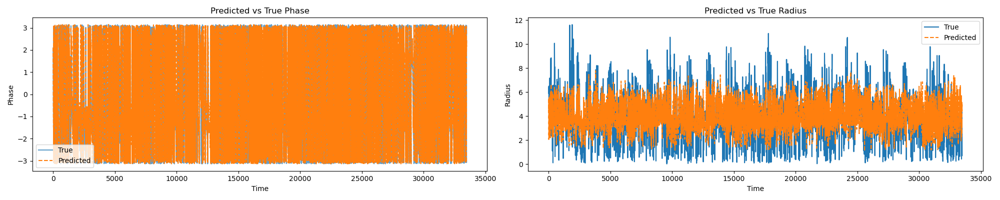

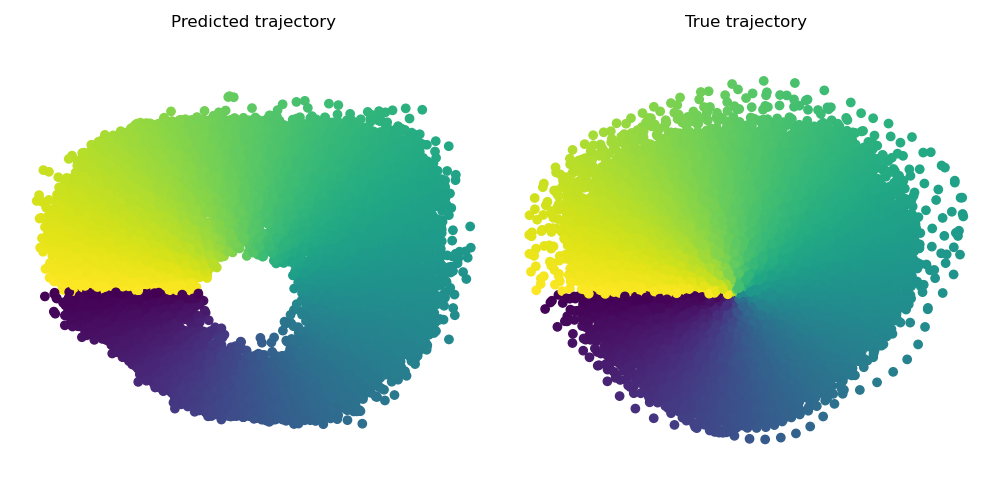

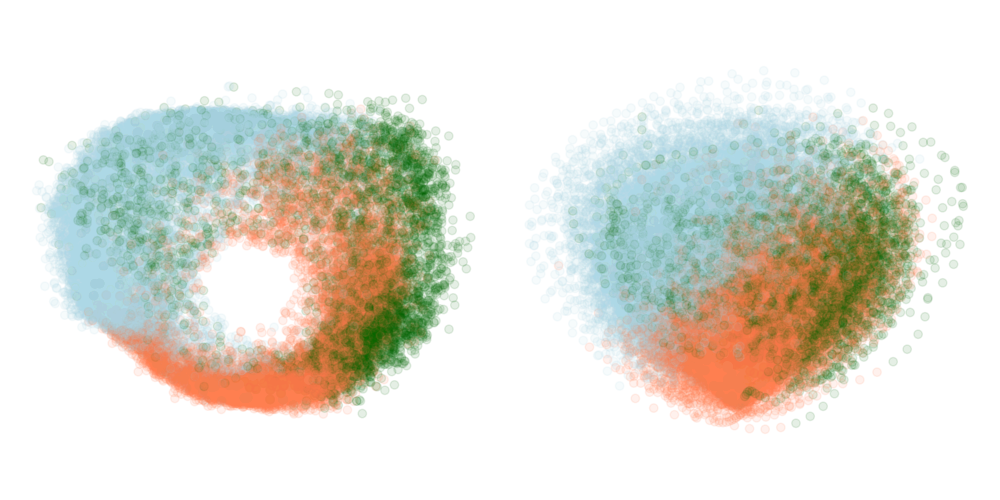

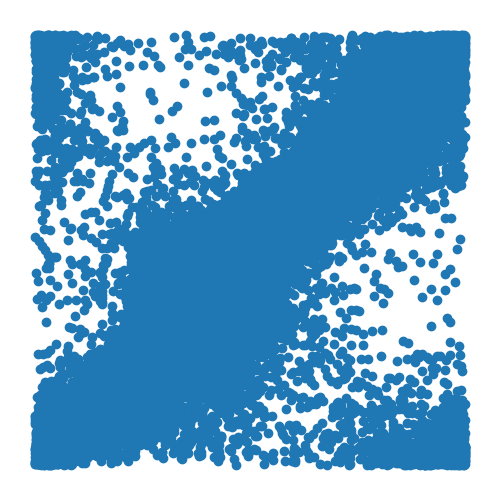

In [5]:

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=[velocity, acceleration, worm_curvature, z],
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z = z,
    cmap=cmap, normalize=normalize
)

worm_angles = [worm_angles[i*1594:(1+i)*1594] for i in range(20)]
worm_radii = [worm_radii[i*1594:(1+i)*1594] for i in range(20)]



# plot a worm

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


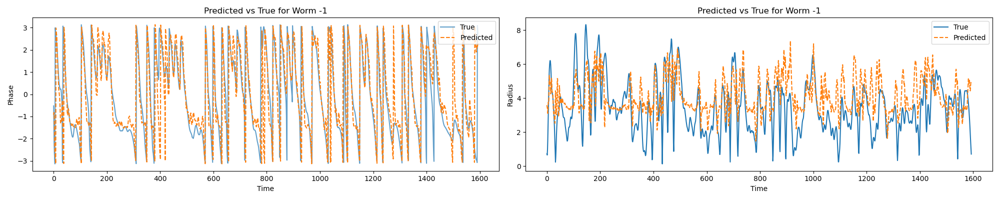

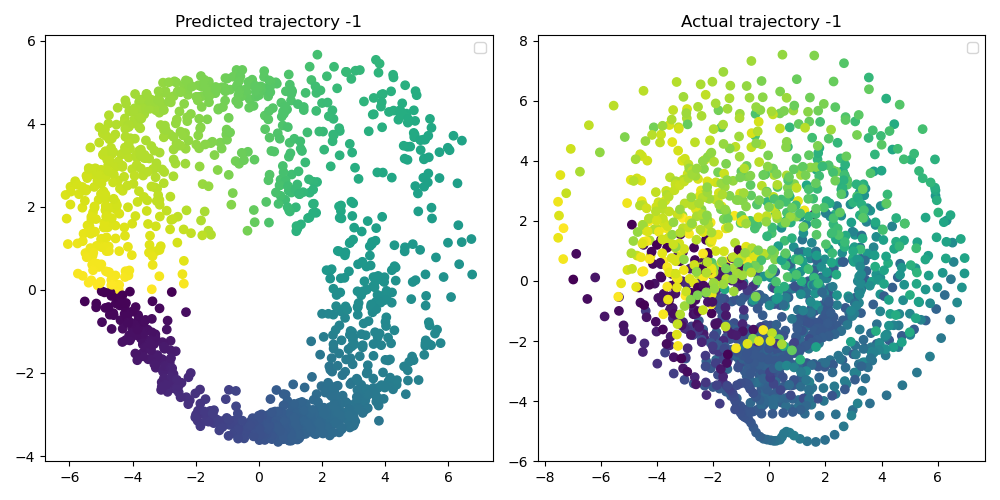

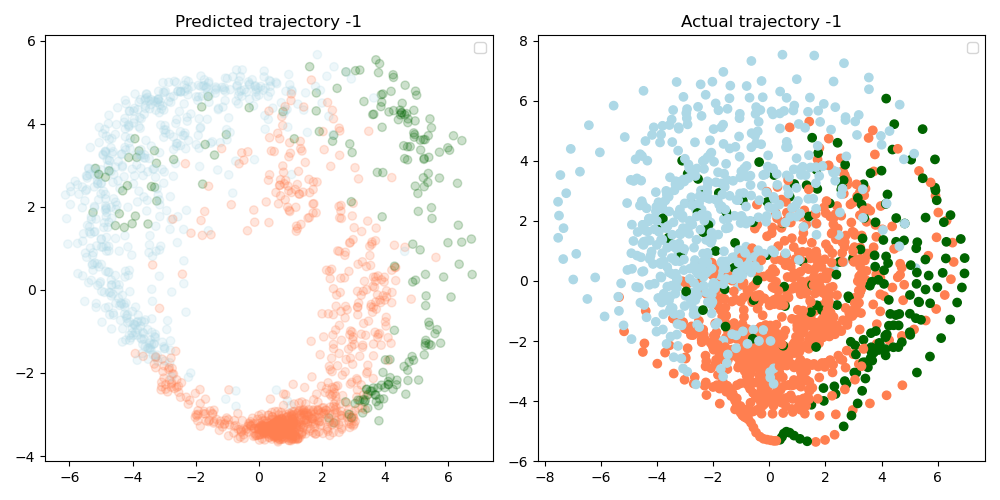

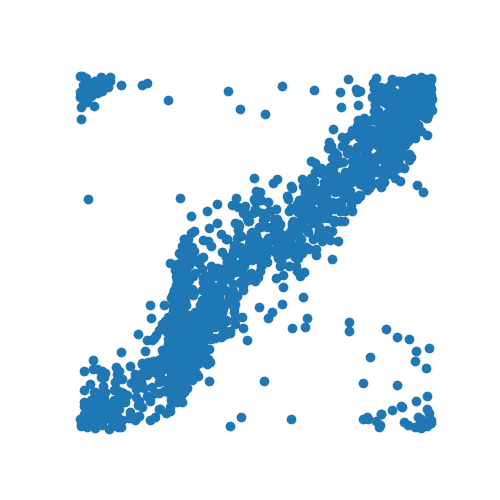

In [6]:

pred_test_angles, pred_test_radii = plot_held_out_worm(model, [velocity, acceleration, worm_curvature, z], y, T, input_stats, new_worm_idx=-1,z=z, cmap=cmap, normalize=normalize)


# Store as new ground truth

In [7]:
T = 5
y = np.array((np.cos(np.concatenate(worm_angles)), np.sin(np.concatenate(worm_angles)), np.concatenate(worm_radii)))
y_new = np.array((np.cos(pred_test_angles), np.sin(pred_test_angles), pred_test_radii))
y = np.hstack((y, y_new))
y = np.array([y[:,i*1594:1594*(i+1)].T for i in range(21)])


# Activity-directed network

Epoch 0, Train Loss: 1.0713, Test Loss: 0.9979
Epoch 50, Train Loss: 0.2286, Test Loss: 0.1147
Epoch 100, Train Loss: 0.1663, Test Loss: 0.1026
Epoch 150, Train Loss: 0.1389, Test Loss: 0.0879
Epoch 200, Train Loss: 0.1224, Test Loss: 0.0736
Epoch 250, Train Loss: 0.1124, Test Loss: 0.0660
Epoch 300, Train Loss: 0.1060, Test Loss: 0.0607
Epoch 350, Train Loss: 0.1009, Test Loss: 0.0583
Epoch 400, Train Loss: 0.0978, Test Loss: 0.0563
Epoch 450, Train Loss: 0.0947, Test Loss: 0.0551
Final Training Loss: 0.0920
Final Test Loss: 0.0539


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(tensor([-2.2200, -2.8420,  3.1230,  ...,  1.8305,  1.8075,  1.7769]),
 tensor([3.5378, 3.8284, 4.1381,  ..., 4.2574, 4.2107, 4.1537]))

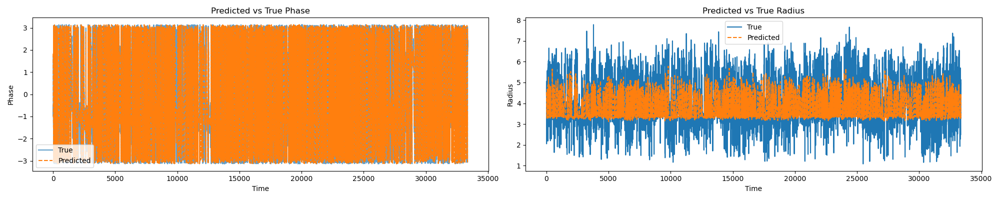

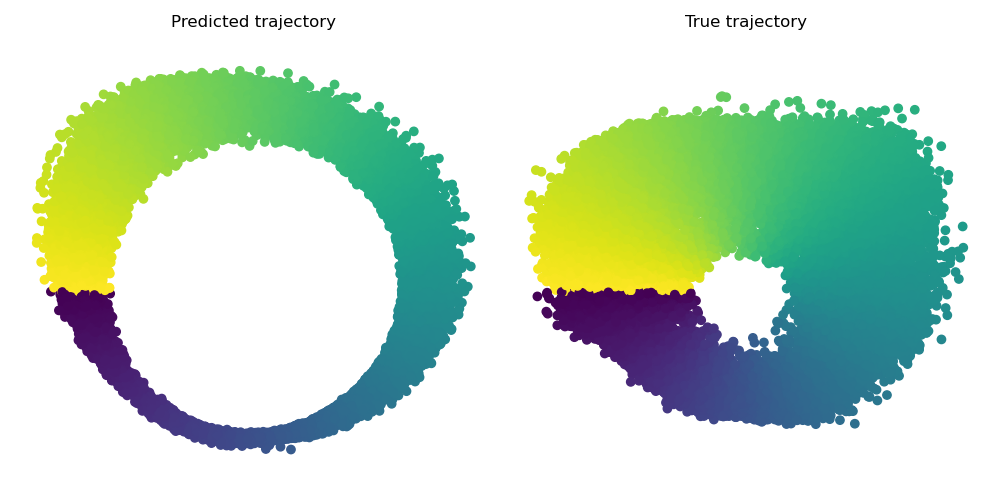

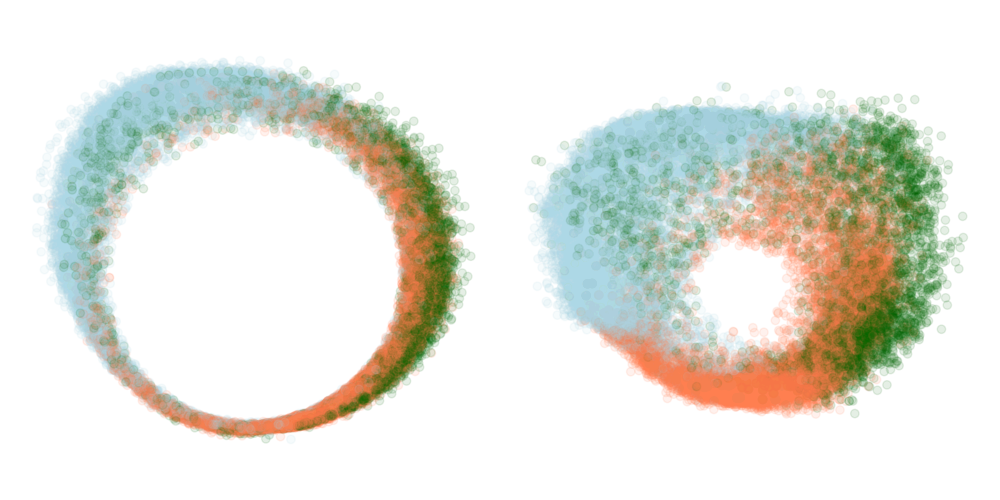

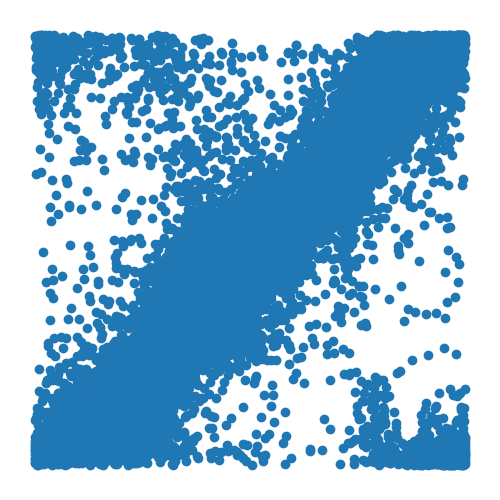

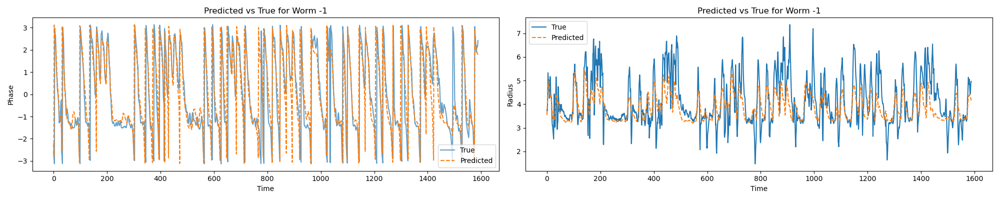

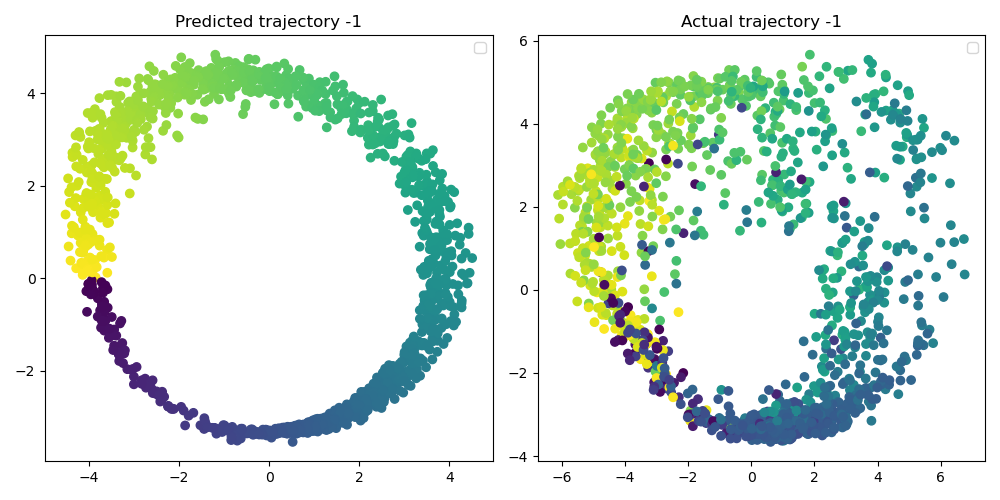

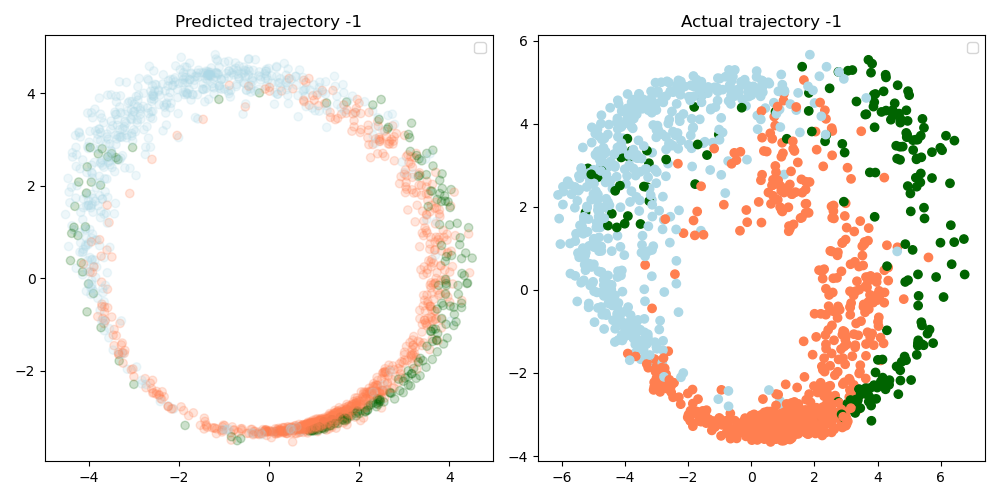

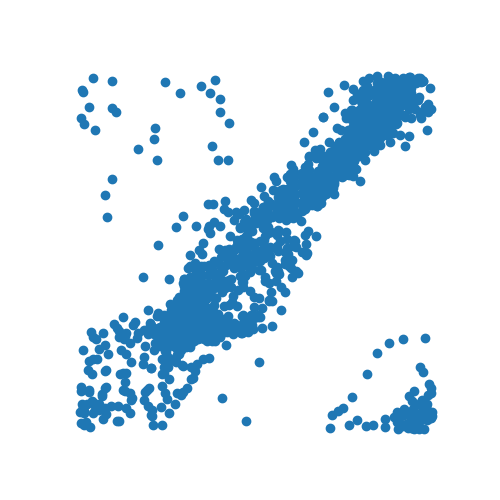

In [8]:
input_features = np.transpose(np.array(q_x)[:,5:], [2,0,1] )
X_all, y_all = prepare_data(input_features, y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize)
model_type = 'ff'  # or 'ff'


input_dim = X_train.shape[-1]* X_train.shape[-2]
output_dim = y_train.shape[1]

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500,
)

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=input_features,
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z=np.array(z)[:,5:],
    cmap=cmap,
    normalize=normalize
)

worm_angles = [worm_angles[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]
worm_radii = [worm_radii[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]

plot_held_out_worm(model, input_features, y, T, input_stats, new_worm_idx=-1,z=np.array(z)[:,5:], cmap=cmap, normalize=normalize)


# behaviorally-directed network

Epoch 0, Train Loss: 0.8979, Test Loss: 0.8601
Epoch 50, Train Loss: 0.1916, Test Loss: 0.1077
Epoch 100, Train Loss: 0.1384, Test Loss: 0.0859
Epoch 150, Train Loss: 0.1164, Test Loss: 0.0727
Epoch 200, Train Loss: 0.1025, Test Loss: 0.0624
Epoch 250, Train Loss: 0.0924, Test Loss: 0.0538
Epoch 300, Train Loss: 0.0857, Test Loss: 0.0480
Epoch 350, Train Loss: 0.0809, Test Loss: 0.0448
Epoch 400, Train Loss: 0.0783, Test Loss: 0.0413
Epoch 450, Train Loss: 0.0756, Test Loss: 0.0395
Final Training Loss: 0.0730
Final Test Loss: 0.0377


/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/rslds/angle/plot_funcs.py:143: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(20, 4))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in 

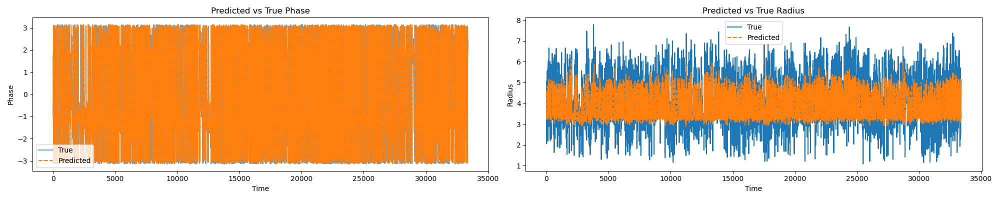

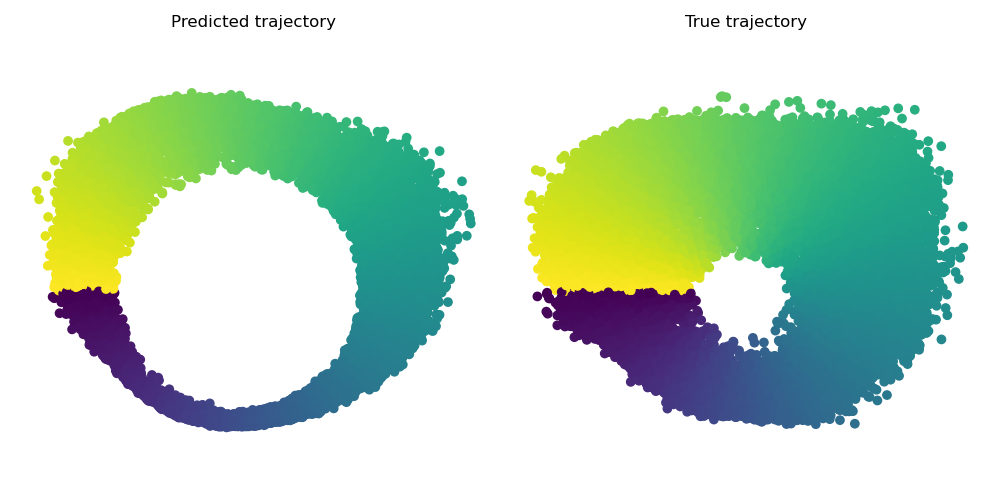

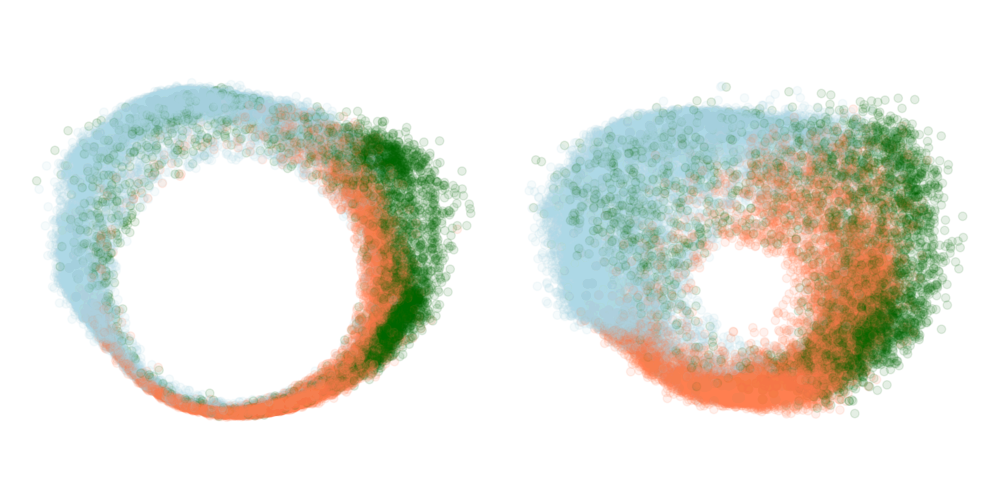

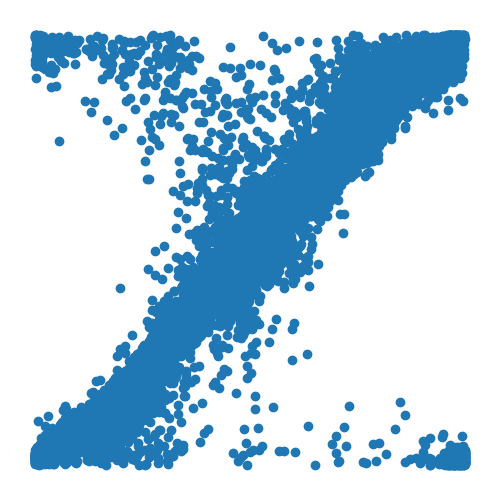

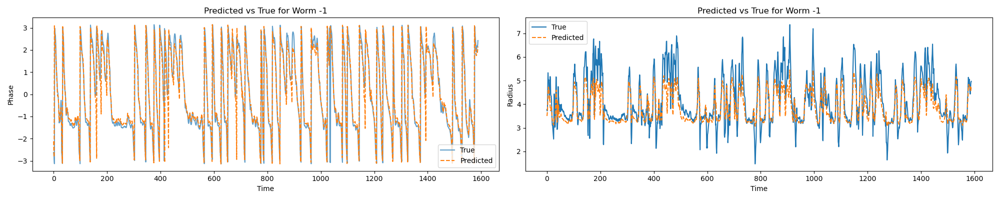

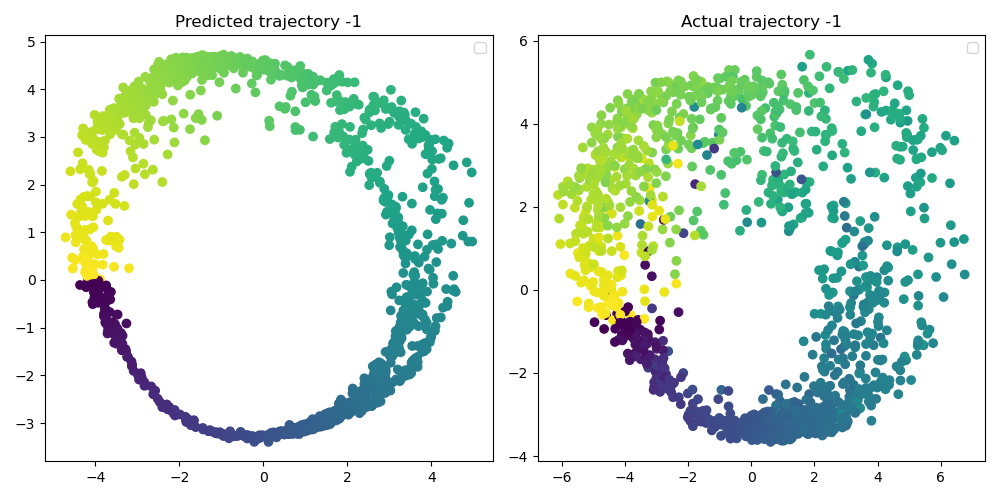

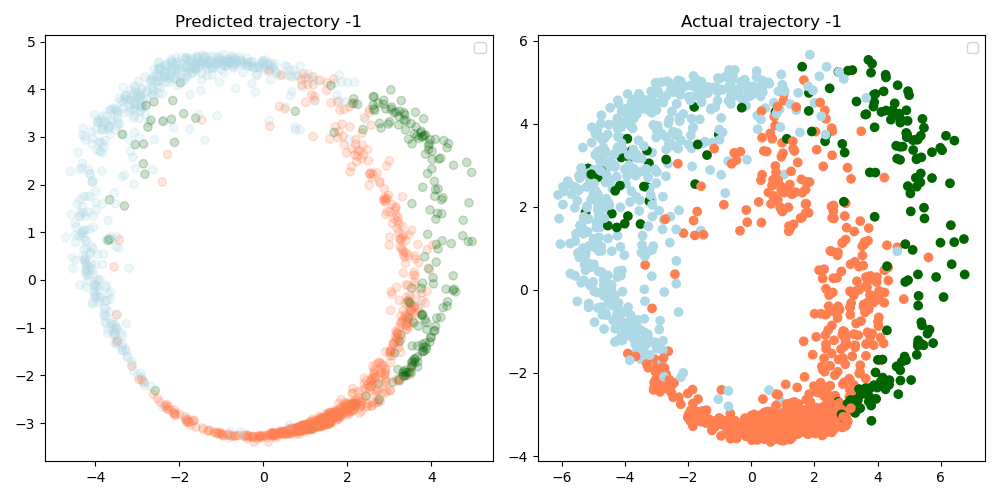

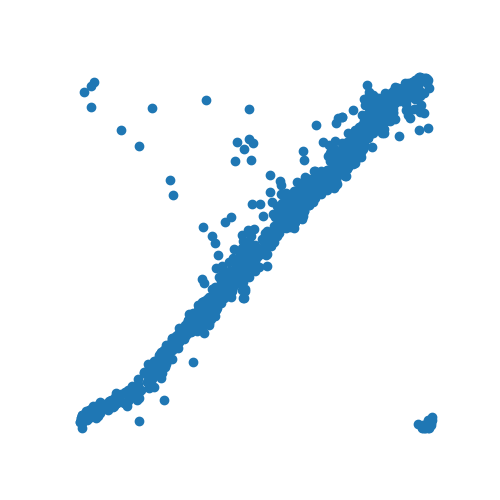

In [9]:
X_all, y_all = prepare_data(np.array([velocity, acceleration, worm_curvature, z])[:,:,5:], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize)

input_dim = X_train.shape[-1]* X_train.shape[-2]
output_dim = y_train.shape[1]

model_type = 'ff'  # or 'ff'

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500
)

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=np.array([velocity, acceleration, worm_curvature, z])[:,:,5:],
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z=np.array(z)[:,5:],
    cmap=cmap,
    normalize=normalize
)

worm_angles = [worm_angles[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]
worm_radii = [worm_radii[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]


# Assuming your data, model, and other relevant variables are loaded
pred_test_angles, pred_test_radii = plot_held_out_worm(model, np.array([velocity, acceleration, worm_curvature, z])[:,:,5:], y, T, input_stats, new_worm_idx=-1,z=np.array(z)[:,5:],cmap=cmap, normalize=normalize)


# Phase respomse plot

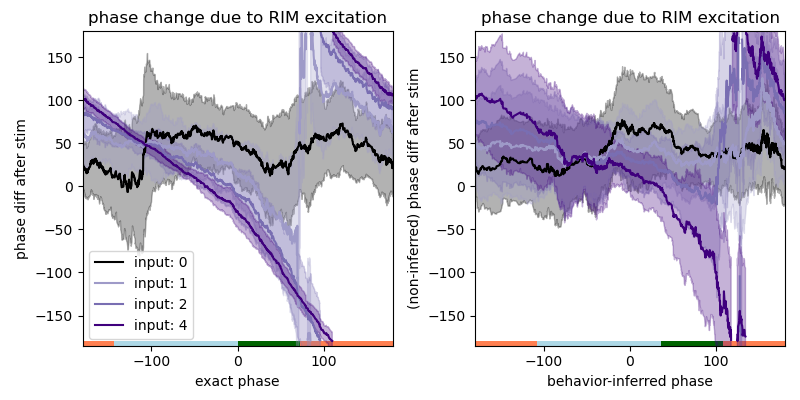

In [10]:
from scipy.stats import circmean, circstd, mode

def bin_phase_data(phases, data, num_bins=20, metric="mode"):
    """Bin the phase data and find the mode of the associated data in each bin."""
    # Define the bin edges
    bins = np.linspace(np.min(phases), np.max(phases), num_bins+1)  # Bins for phase data from -180 to 180 degrees
    binned_data = []
    binned_std = []

    # Find the bin indices for each phase
    bin_indices = np.digitize(phases, bins) - 1  # Get the correct bin for each phase

    # Loop over each bin and find the mode of the associated data
    for i in range(num_bins):
        # Mask the data corresponding to this bin
        bin_mask = bin_indices == i
        bin_data = data[bin_mask]
        
        # Compute the mode of the data in this bin
        if len(bin_data) > 0:  # Only compute mode if there is data in the bin
            if metric=="mode":
                mode_val, _ = mode(bin_data)
            else:
                mode_val = np.mean(bin_data)
                binned_std.append(np.std(bin_data))
            binned_data.append(mode_val)
        else:
            binned_data.append(np.nan)  # If no data in the bin, append NaN

    return bins[:-1], np.array(binned_data), np.array(binned_std)  #

def circular_stats(data, window_size=5):
    """Compute circular mean and standard deviation for smoothing PRC."""
    smoothed, std_dev = [], []
    for i in range(len(data)):
        start = max(0, i - window_size//2)
        end = min(len(data), i + window_size//2 + 1)
        smoothed.append(circmean(data[start:end], high=180, low=-180))
        std_dev.append(circstd(data[start:end], high=180, low=-180))
    return np.array(smoothed), np.array(std_dev)

def detect_discontinuities(phases, smoothed_shifts, threshold=90):
    """Break the plot where the phase shift jumps suddenly (e.g., near ±180°)."""
    phase_diff = np.abs(np.diff(smoothed_shifts, prepend=smoothed_shifts[0]))
    mask = phase_diff > threshold  # Detect large jumps
    smoothed_shifts_masked = np.copy(smoothed_shifts)
    smoothed_shifts_masked[mask] = np.nan  # Break the line where jumps occur
    return smoothed_shifts_masked

def plot_phase_resp(phase, response, z=[], label=None, ax=None, color=None):
    phase= np.array(phase)
    response = np.array(response)
    idx = np.argsort(phase)
    sorted_phase = phase[idx]
    sorted_response = response[idx]

    sorted_response_mean, sorted_response_var = circular_stats(sorted_response, window_size=50)
    sorted_response_mean = detect_discontinuities(sorted_phase, sorted_response_mean)


    if ax == None:
        fig,ax = plt.subplots()
    l1 = ax.plot(sorted_phase, sorted_response_mean, label=label, color=color)[0]
    ax.fill_between(sorted_phase, sorted_response_mean - sorted_response_var, sorted_response_mean+sorted_response_var, alpha = 0.3, color=l1.get_color())
    

    if np.size(z)>0:
        # find disc state by phase
        sorted_z = z[idx]
        #bin data, find mode of each bin
        _, states,_ = bin_phase_data(sorted_phase, sorted_z)

        ax.imshow(np.array(states)[np.newaxis,:], extent=[-180,180, -185,-180], cmap=cmap, vmin=0, vmax=6)

    ax.set_xlabel("Phase")
    ax.set_ylabel("Response")
    ax.set_ylim(-185, 180)
    ax.set_xlim(-180, 180)
    return ax

def compute_phase(x, pca):
    """Compute phase from the first two PCs."""
    x=pca.transform(x[np.newaxis,:])
    return np.degrees(np.arctan2(x[:, 1], x[:, 0]))  # PC2 vs PC1

def apply_perturbation(slds, prefix, input, pert_strength, pert_time):
    """Apply a perturbation at a specific time and return new phase trajectory."""
    T = input.shape[0]
    pert_input = input.copy()
    pert_input[pert_time] += pert_strength  # Small perturbation
    
    # Generate perturbed trajectory
    _, x_pert, _ = slds.sample(T=T, prefix=prefix, input=pert_input)
    return compute_phase(x_pert)

def phase_response_curve(slds, init_cons, input, pca, offset=-1):
    """Compute the phase response curve (PRC) by applying perturbations at different phases."""
    T = input.shape[0]

    phase_shifts = []
    orig_thetas = []
    final_thetas = []
    final_behs = []
    for i in range(init_cons.shape[0]):
        prefix = [np.array([0]), np.array([init_cons[i]]), np.array([np.zeros(slds.N)])]
        theta_orig = compute_phase(init_cons[i], pca)
        _, x_pert, _ = slds.sample(T=T, prefix=prefix, input=input)
        final_behs.append(beh_decoder.predict(x_pert)[offset])
        theta_pert = compute_phase(x_pert[-1], pca)
        delta_theta = np.unwrap(np.radians(theta_pert - theta_orig))  # Convert to radians and unwrap
        delta_theta = np.degrees(delta_theta)  # Convert back to degrees
        delta_theta = (theta_pert - theta_orig + 180) % 360 - 180 # Keep in 0 to 2π
        phase_shifts.append(delta_theta[0])
        orig_thetas.append(theta_orig[0])
        final_thetas.append(theta_pert[0])


    return orig_thetas, phase_shifts, final_thetas, final_behs



t=10
inputs = np.zeros((t,new_slds.M))
input_id = input_dict["RIM"]
input_str = 1
inputs[:,input_id] = input_str


fig,ax = plt.subplots(1,2, figsize=(8,4))
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][2:]
colors[0] = (0,0,0,1)

for input_str in [0,1,2,4]:
    phase, response, final, final_beh  = phase_response_curve(new_slds, q_x[-1], input_str*inputs, pca)
    plot_phase_resp(phase, response, q_z[-1], ax=ax[0], label=f"input: {input_str}", color=colors[input_str])

    plot_phase_resp((270-np.degrees(pred_test_angles))%360-180, response[5:], q_z[-1][5:], ax=ax[1], label=f"input: {input_str}", color=colors[input_str])

ax[0].set_xlabel("exact phase")
ax[0].set_ylabel("phase diff after stim")
ax[0].set_title("phase change due to RIM excitation")

ax[1].set_xlabel("behavior-inferred phase")
ax[1].set_ylabel("(non-inferred) phase diff after stim")
ax[1].set_title("phase change due to RIM excitation")

ax[0].legend()
fig.tight_layout()


# Phase reversal prob plot

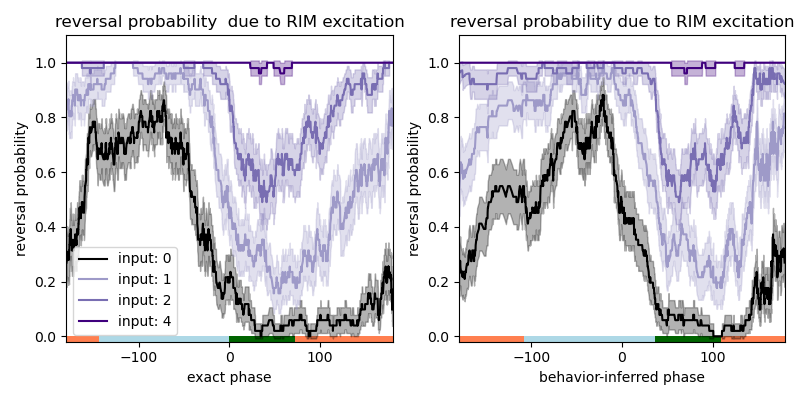

In [11]:


def plot_rev_prob(phase, beh, z=[], label=None, ax=None, color=None, window_size=50, beh1=True):
    phase= np.array(phase)
    if beh1:
        beh = np.array(beh) == 1
    idx = np.argsort(phase)
    sorted_phase = phase[idx]
    sorted_beh= beh[idx]

    sorted_beh_mean, sorted_beh_var = circular_stats(sorted_beh, window_size=window_size)


    if ax == None:
        fig,ax = plt.subplots()
    l1 = ax.plot(sorted_phase, sorted_beh_mean, label=label, color=color)[0]
    ax.fill_between(sorted_phase, sorted_beh_mean - sorted_beh_var/5, sorted_beh_mean+sorted_beh_var/5, alpha = 0.3, color=l1.get_color())
    

    if np.size(z)>0:
        # find disc state by phase
        sorted_z = z[idx]
        #bin data, find mode of each bin
        _, states,_ = bin_phase_data(sorted_phase, sorted_z)

        ax.imshow(np.array(states)[np.newaxis,:], extent=[-180,180, -0.02,0], cmap=cmap, vmin=0, vmax=6, aspect="auto")

    ax.set_xlabel("Phase")
    ax.set_ylabel("Response")
    ax.set_ylim(-0.02,1.1)
    ax.set_xlim(-180, 180)
    return ax








fig,ax = plt.subplots(1,2, figsize=(8,4))
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][2:]
colors[0] = (0,0,0,1)

for input_str in [0,1,2,4]:
    phase, response, final, final_beh  = phase_response_curve(new_slds, q_x[-1], input_str*inputs, pca)
    plot_rev_prob(phase, final_beh, q_z[-1], ax=ax[0],  label=f"input: {input_str}", color=colors[input_str])

    plot_rev_prob((270-np.degrees(pred_test_angles))%360-180, final_beh[5:], q_z[-1][5:], ax=ax[1], label=f"input: {input_str}", color=colors[input_str])

ax[0].set_xlabel("exact phase")
ax[0].set_ylabel("reversal probability")
ax[0].set_title("reversal probability  due to RIM excitation")

ax[1].set_xlabel("behavior-inferred phase")
ax[1].set_ylabel("reversal probability")
ax[1].set_title("reversal probability due to RIM excitation")

ax[0].legend()
fig.tight_layout()

# look at $d\theta$

Text(0.5, 1.0, 'dtheta distribution \n mean (degrees): 6.890538587084868')

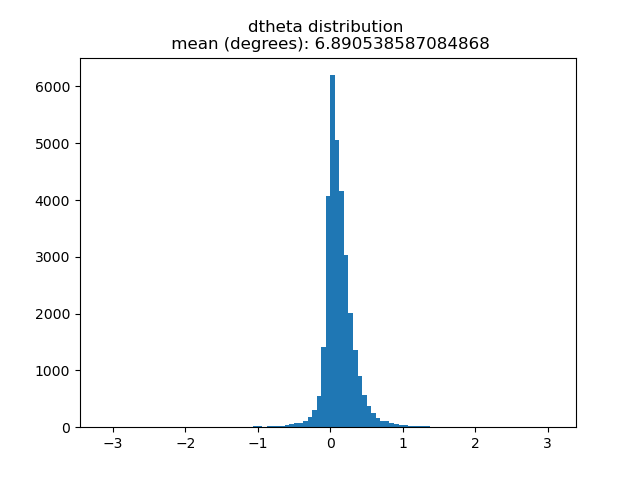

In [12]:
def circular_diff(angle1, angle2):
    return np.angle(np.exp(1j * (angle1 - angle2)))


worm_angs_rot = np.array([np.radians((270-np.degrees(w_a + np.pi))%360-180) for w_a in worm_angles]) #put them in the right coordinates so that dtheta is positive, negative end is turning, positive end is reverse, middle is fwd
worm_angs = np.array(worm_angles) #put them in the right coordinates so that dtheta is positive, negative end is turning, positive end is reverse, middle is fwd
worm_dangles = np.array([circular_diff(w_a[:-1], w_a[1:]) for w_a in worm_angs])

worm_angs_flat = np.ravel(worm_angs[:,:-1])
worm_angs_rot_flat = np.ravel(worm_angs_rot[:,:-1])
worm_dangles_flat = np.ravel(worm_dangles)

fig,ax = plt.subplots()
ax.hist(worm_dangles_flat, bins = np.arange(-np.pi, np.pi, np.pi/50))
ax.set_title(f"dtheta distribution \n mean (degrees): {180/np.pi * worm_dangles_flat.mean()}")


# $d\theta$ distribution for different regions of the circle

Text(0, 0.5, '$d\\theta$')

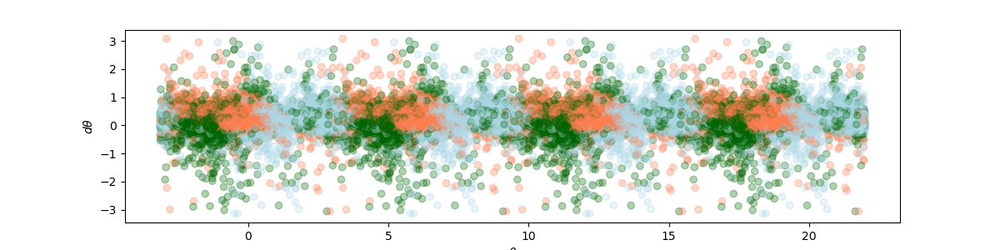

In [13]:
fig,ax = plt.subplots(figsize=(12,3))

z_flat = np.array(z)[:20, 10:-1].flatten()
ax.scatter(worm_angs_rot_flat, worm_dangles_flat, c=z_flat, cmap=cmap, vmin=0, vmax=7, alpha=0.3)
ax.scatter(worm_angs_rot_flat+2*np.pi, worm_dangles_flat, c=z_flat, cmap=cmap, vmin=0, vmax=7, alpha=0.3)
ax.scatter(worm_angs_rot_flat+4*np.pi, worm_dangles_flat, c=z_flat, cmap=cmap, vmin=0, vmax=7, alpha=0.3)
ax.scatter(worm_angs_rot_flat+6*np.pi, worm_dangles_flat, c=z_flat, cmap=cmap, vmin=0, vmax=7, alpha=0.3)

ax.set_xlabel(r"$\theta$")
ax.set_ylabel(r"$d\theta$")

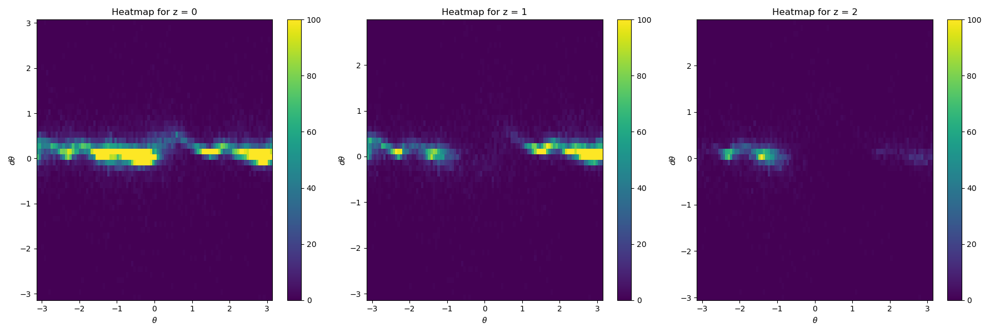

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Example data (replace with your actual data)
# Assuming worm_angs_rot_flat and worm_dangles_flat are your data arrays
# Also assuming z is a flattened version of your z data

# Prepare the data
z_vals = [0, 1, 2]  # The three z values
N_BINS_ANGLE = 100  # Number of bins for the angle axis
N_BINS_DANGLE = 50  # Number of bins for the dangle axis

# Set up the figure with 3 subplots, one for each z value
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Loop over the z values and create a heatmap for each
for i, z_val in enumerate(z_vals):
    # Filter data based on current z value
    z_mask = (z_flat>= z_val)
    
    # Get the corresponding data for the current z value
    ang_data = worm_angs_rot_flat[z_mask]
    dangle_data = worm_dangles_flat[z_mask]
    
    # Create a 2D histogram for the current z value
    heatmap, xedges, yedges = np.histogram2d(ang_data, dangle_data, bins=[N_BINS_ANGLE, N_BINS_DANGLE])
    
    # Plot the heatmap
    c = axes[i].pcolormesh(xedges, yedges, heatmap.T, cmap='viridis', shading='auto', vmax=100)
    
    # Set axis labels and titles
    axes[i].set_xlabel(r"$\theta$")
    axes[i].set_ylabel(r"$d\theta$")
    axes[i].set_title(f"Heatmap for z = {z_val}")
    
    # Add colorbar
    fig.colorbar(c, ax=axes[i])

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


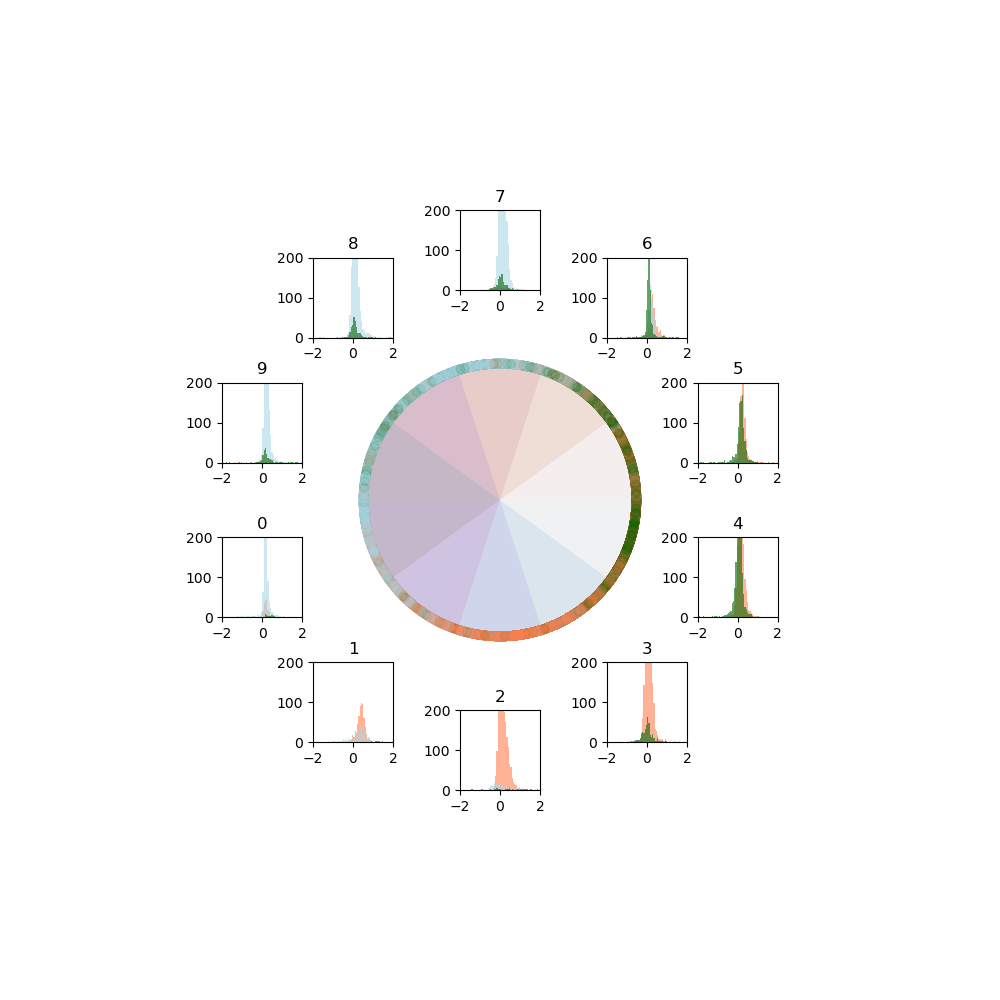

In [15]:
from matplotlib.patches import Wedge


# Parameters
N_BINS = 10
ang_bins_edges = np.linspace(-np.pi, np.pi, N_BINS + 1)
ang_bins_centers = (ang_bins_edges[:-1] + ang_bins_edges[1:]) / 2
ang_bins = np.digitize(worm_angs_flat, bins=ang_bins_edges) - 1

# Colormaps
hist_cmap = plt.cm.twilight_shifted
scatter_cmap = plt.cm.viridis  # Or cividis, plasma, etc.

colors = hist_cmap((ang_bins_centers + np.pi) / (2 * np.pi))

# Set up figure
fig = plt.figure(figsize=(10, 10))
center = [0.5, 0.5]
radius = 0.25

# Histogram settings
w, h = 0.08, 0.08

for i in range(N_BINS):
    theta = ang_bins_centers[i]
    x = center[0] + radius * np.cos(theta)
    y = center[1] + radius * np.sin(theta)
    
    ax_i = fig.add_axes([x - w/2, y - h/2, w, h])

    for k in range(4):
        data = worm_dangles_flat[(ang_bins == i)*(z_flat == k)]
        ax_i.hist(data, bins=np.arange(-2, 2, np.pi/50), color=palette[k], edgecolor='none', linewidth=0.3, alpha=0.6)


    ax_i.set_xlim(-2, 2); ax_i.set_ylim(0, 200)
    ax_i.set_facecolor('white')
    ax_i.set_title(i)

# --- Central circular plot with scatter overlay ---
# Use Cartesian axis
ax_center = fig.add_axes([0.35, 0.35, 0.3, 0.3])
ax_center.set_aspect('equal')
ax_center.axis("off")

# Background circle
circle = plt.Circle((0, 0), 1, color='lightgray', fill=False, linestyle='--', linewidth=0.8)
ax_center.add_artist(circle)


# Add background angular wedges
for i in range(N_BINS):
    theta1 = np.degrees(ang_bins_edges[i])
    theta2 = np.degrees(ang_bins_edges[i+1])
    wedge = Wedge(center=(0, 0), r=1, theta1=theta1, theta2=theta2,
                  facecolor=colors[i], edgecolor='none', alpha=0.3)
    ax_center.add_patch(wedge)
# Scatter on circle
x = np.cos(worm_angs_flat)
y = np.sin(worm_angs_flat)

cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))
sc = ax_center.scatter(x, y, c=z_flat, cmap=cmap, alpha=0.1, vmin=0, vmax=7)

ax_center.set_xlim(-1.1, 1.1)
ax_center.set_ylim(-1.1, 1.1)
ax_center.set_xticks([])
ax_center.set_yticks([])
ax_center.set_facecolor('white')

fig.patch.set_facecolor('white')
plt.show()


# What drives the angle

In [16]:
q_x_flat = np.array(q_x)[:20, 10:-1].reshape(20*1588, 9)

In [17]:
import numpy as np
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression

# Assuming you have the following arrays:
# worm_angs_flat, z_flat, q_x_flat (shape TxD), and dtheta_flat (the derivative of theta)

# Parameters
N_BINS = 10
ang_bins_edges = np.linspace(-np.pi, np.pi, N_BINS + 1)
ang_bins_centers = (ang_bins_edges[:-1] + ang_bins_edges[1:]) / 2
angle_bins = np.digitize(worm_angs_flat, bins=ang_bins_edges) - 1

# Motor states (z_flat) are typically discrete. Get the unique motor states (you may have a range of discrete values)
unique_motor_states = np.unique(z_flat)
unique_motor_states = [5]
# Placeholder for the models
models = {}


for motor_state in unique_motor_states:
    for angle_bin in np.unique(angle_bins):
        
        # Select the data for the current motor state and angle bin
        mask = (z_flat < motor_state) & (angle_bins == angle_bin)
        
        if np.sum(mask) < 5:  # or whatever threshold you want
            continue  # Skip bins with too few data points
        
        # Prepare the inputs for the model
        X = np.column_stack([q_x_flat[mask]])  # [theta, latents]
        y = worm_dangles_flat[mask]  # Target is the derivative of theta
        
        # Add constant for the intercept in the linear model
        # X = sm.add_constant(X)
        
        # Fit the model using statsmodels
        model = sm.OLS(y, X).fit()
        
        # Store the model
        models[(0, angle_bin)] = model


# Example: Access the fitted model for a specific motor state and angle bin
motor_state = 0  # Example motor state
angle_bin = 0    # Example angle bin
model = models[(motor_state, angle_bin)]

# Print the model summary (for statsmodels)
print(model.summary())


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.227
Model:                            OLS   Adj. R-squared (uncentered):              0.222
Method:                 Least Squares   F-statistic:                              51.71
Date:                Tue, 13 May 2025   Prob (F-statistic):                    1.62e-82
Time:                        12:27:24   Log-Likelihood:                         -280.51
No. Observations:                1598   AIC:                                      579.0
Df Residuals:                    1589   BIC:                                      627.4
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

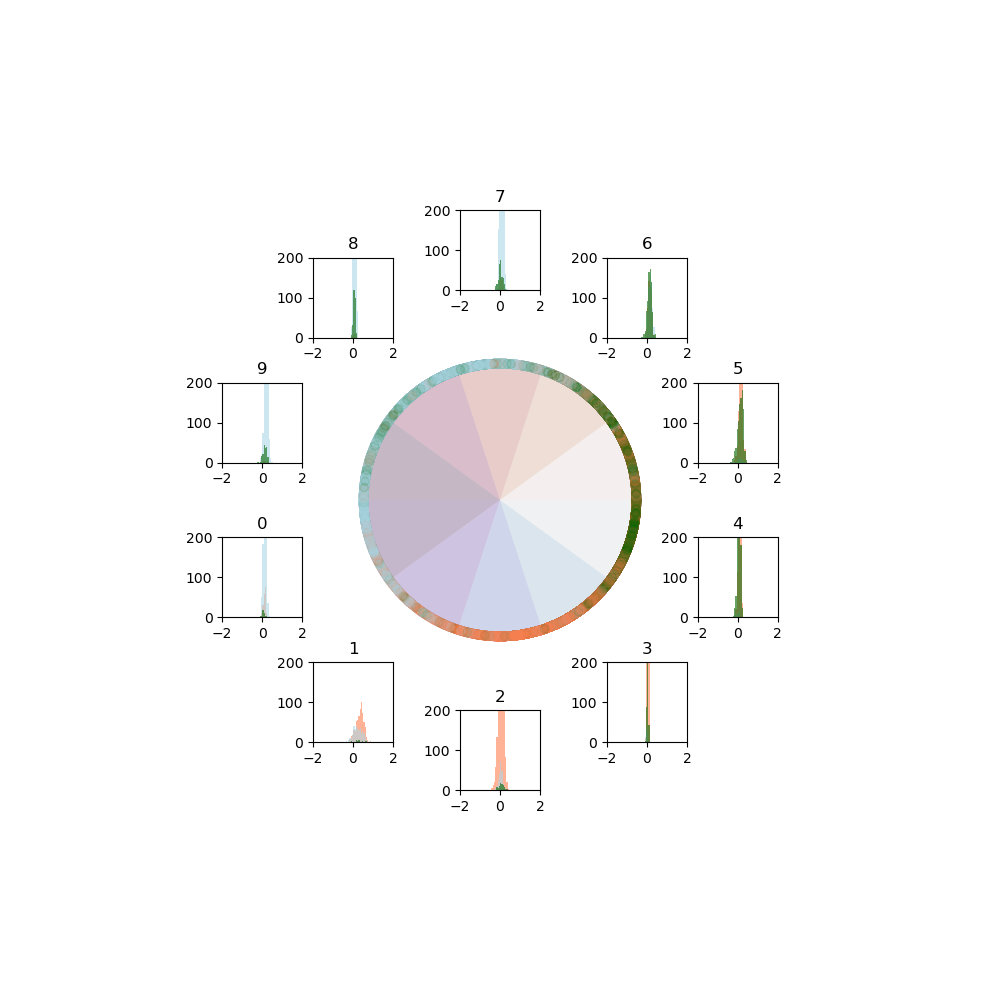

In [18]:
from matplotlib.patches import Wedge
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Parameters
N_BINS = 10
ang_bins_edges = np.linspace(-np.pi, np.pi, N_BINS + 1)
ang_bins_centers = (ang_bins_edges[:-1] + ang_bins_edges[1:]) / 2
ang_bins = np.digitize(worm_angs_flat, bins=ang_bins_edges) - 1

# Colormaps
hist_cmap = plt.cm.twilight_shifted
scatter_cmap = plt.cm.viridis  # Or cividis, plasma, etc.

colors = hist_cmap((ang_bins_centers + np.pi) / (2 * np.pi))

# Set up figure
fig = plt.figure(figsize=(10, 10))
center = [0.5, 0.5]
radius = 0.25

# Histogram settings
w, h = 0.08, 0.08

predicted_dangles = np.full_like(worm_dangles_flat, fill_value=np.nan, dtype=float)

for i in range(N_BINS):
    for k in range(3):  # or however many motor states you have
        mask = (ang_bins == i) & (z_flat < 5)
        if not np.any(mask):
            continue

        key = (k, i)
        if key not in models:
            continue

        X = np.column_stack([q_x_flat[mask]])
        # X = sm.add_constant(X)

        model = models[(0, i)]
        pred = model.predict(X)

        predicted_dangles[mask] = pred


# --- Now Plot the Circle of Histograms with Predicted dAngles ---
for i in range(N_BINS):
    theta = ang_bins_centers[i]
    x = center[0] + radius * np.cos(theta)
    y = center[1] + radius * np.sin(theta)
    
    ax_i = fig.add_axes([x - w/2, y - h/2, w, h])

    for k in range(3):
        # Get the predicted dangles for the current bin and motor state
        pred_data = predicted_dangles[(ang_bins == i) & (z_flat == k)]
        
        # Plot the histogram for the predicted dangles
        ax_i.hist(pred_data, bins=np.arange(-2, 2, np.pi/50), color=palette[k], edgecolor='none', linewidth=0.3, alpha=0.6)

    ax_i.set_xlim(-2, 2); ax_i.set_ylim(0, 200)
    ax_i.set_facecolor('white')
    ax_i.set_title(i)

# --- Central Circular Plot with Scatter Overlay ---

# Use Cartesian axis
ax_center = fig.add_axes([0.35, 0.35, 0.3, 0.3])
ax_center.set_aspect('equal')
ax_center.axis("off")

# Background circle
circle = plt.Circle((0, 0), 1, color='lightgray', fill=False, linestyle='--', linewidth=0.8)
ax_center.add_artist(circle)

# Add background angular wedges
for i in range(N_BINS):
    theta1 = np.degrees(ang_bins_edges[i])
    theta2 = np.degrees(ang_bins_edges[i+1])
    wedge = Wedge(center=(0, 0), r=1, theta1=theta1, theta2=theta2,
                  facecolor=colors[i], edgecolor='none', alpha=0.3)
    ax_center.add_patch(wedge)

# Scatter on circle (for the motor state)
x = np.cos(worm_angs_flat)
y = np.sin(worm_angs_flat)
sc = ax_center.scatter(x, y, c=z_flat, cmap=cmap, alpha=0.1, vmin=0, vmax=7)

ax_center.set_xlim(-1.1, 1.1)
ax_center.set_ylim(-1.1, 1.1)
ax_center.set_xticks([])
ax_center.set_yticks([])
ax_center.set_facecolor('white')

fig.patch.set_facecolor('white')
plt.show()


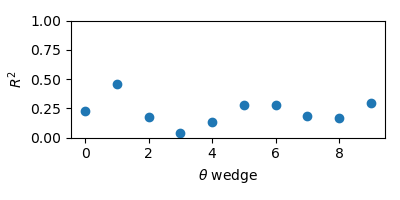

In [19]:
# Example: Access the fitted model for a specific motor state and angle bin
motor_state = 0  # Example motor state

r2s = []
for angle_bin in range(10):
    model = models[(motor_state, angle_bin)]
    r2s.append(model.rsquared)

fig,ax = plt.subplots(figsize=(4,2))
ax.plot(r2s, 'o')
ax.set_xlabel(r"$\theta$ wedge")
ax.set_ylabel(r"$R^2$")
ax.set_ylim(0,1)
fig.tight_layout()

# What neurons are most influentil

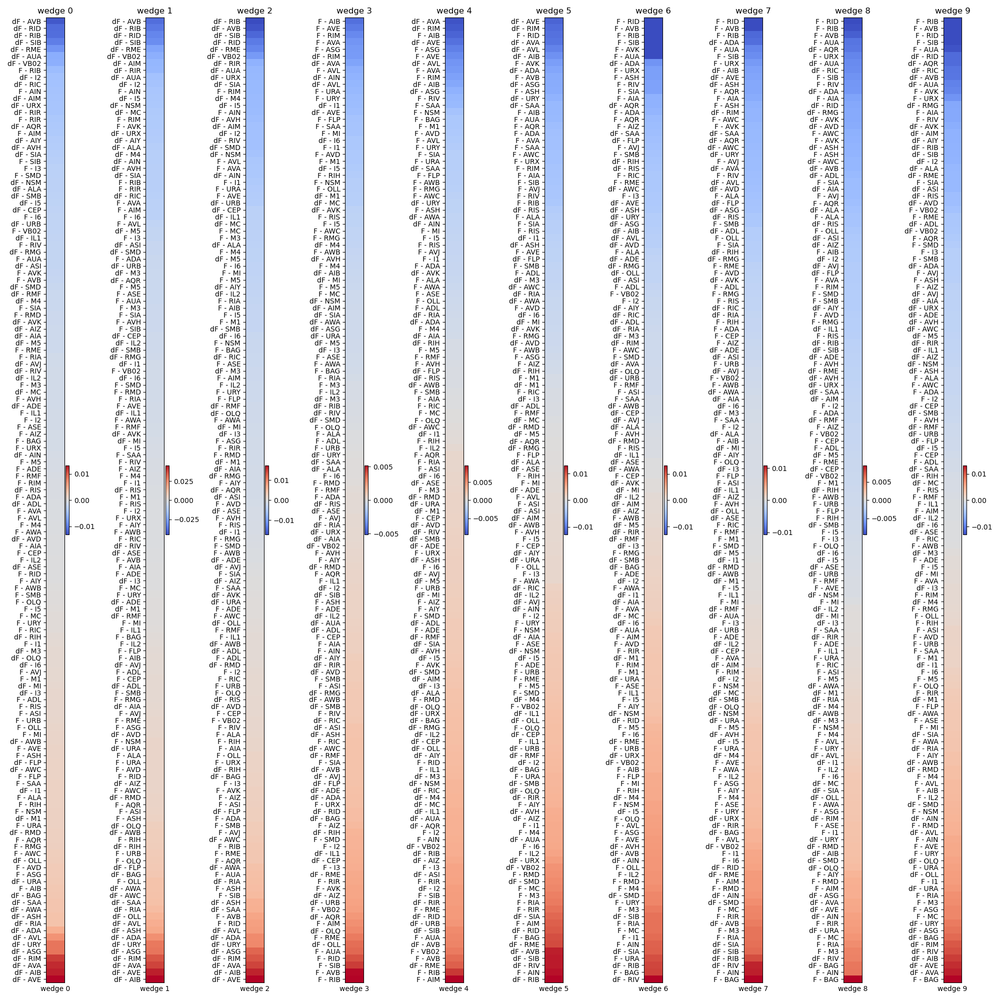

In [20]:


fig,ax = plt.subplots(1, 10, figsize=(20, 20))

for i in range(10):
    neuron_weights = models[(0,i)].params @ slds.emissions.Cs[0].T
    idx = np.argsort(neuron_weights)
    # idx = np.arange(len(neural_labels))
    im = ax[i].imshow(neuron_weights[idx, np.newaxis], aspect="auto", cmap="coolwarm", vmin = -neuron_weights.max(), vmax=neuron_weights.max())
    fig.colorbar(im)
    ax[i].set_yticks(np.arange(len(neural_labels)), labels = neural_labels[idx])
    ax[i].set_xticks([])
    ax[i].set_title(f"wedge {i}")
    ax[i].set_xlabel(f"wedge {i}")

    fig.tight_layout()

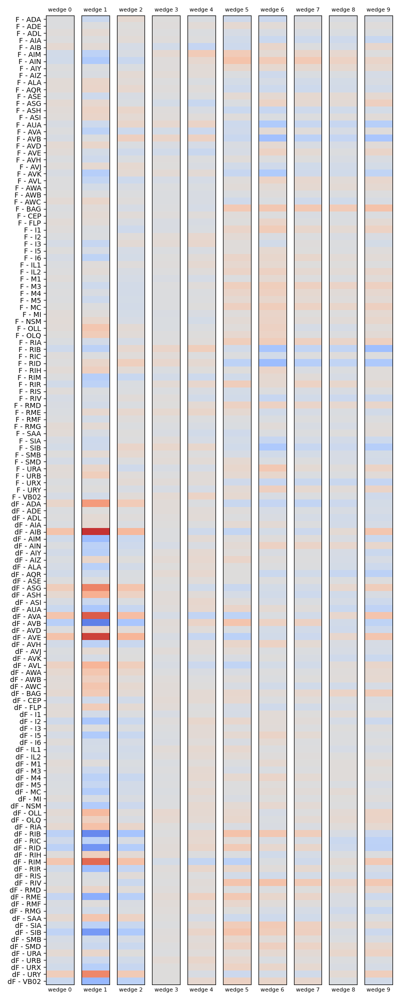

In [21]:


fig,ax = plt.subplots(1, 10, figsize=(8, 20))

for i in range(10):
    neuron_weights = models[(0,i)].params @ slds.emissions.Cs[0].T
    idx = np.argsort(neuron_weights)
    idx = np.arange(len(neural_labels))
    im = ax[i].imshow(neuron_weights[idx, np.newaxis], aspect="auto", cmap="coolwarm", vmin = -0.05, vmax=0.05)
    ax[0].set_yticks(np.arange(len(neural_labels)), labels = neural_labels[idx])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(f"wedge {i}", fontsize=8)
    ax[i].set_xlabel(f"wedge {i}", fontsize=8)

    fig.tight_layout()

Text(0, 0.5, '$\\theta$ wedge')

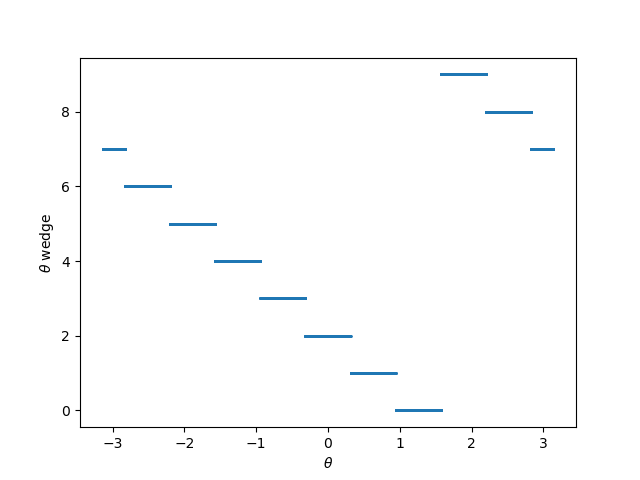

In [35]:
fig, ax = plt.subplots()


ax.scatter(worm_angs_rot_flat, ang_bins, s=1)
ax.set_xlabel(r"$\theta$")
ax.set_ylabel(r"$\theta$ wedge")

In [23]:
neuron_id = "F - RIM"

weighting=[]
for i in tqdm(range(len(worm_angs_flat))):
    ang_bin = ang_bins[i]
    model = models[(0,ang_bin)]
    bag_weight = (slds.emissions.Cs[0] @ model.params)[neural_labels == neuron_id]
    bag_act = (slds.emissions.Cs[0] @ q_x_flat[i])[neural_labels == neuron_id]
    weighting.append( bag_act * bag_weight)

100%|██████████| 31760/31760 [00:10<00:00, 3022.63it/s]


(-0.05, 0.05)

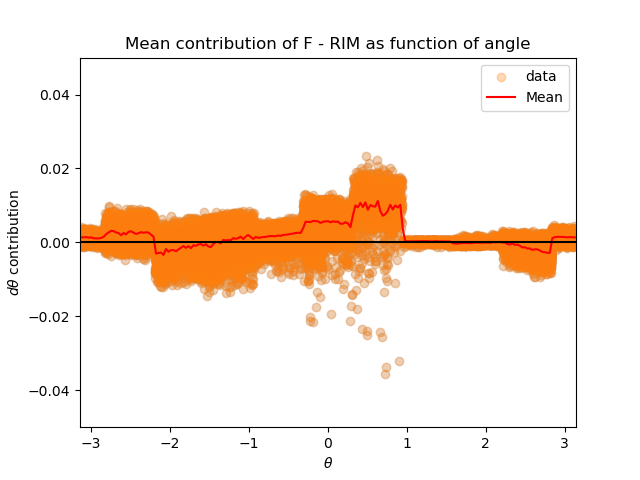

In [24]:
from scipy.stats import ttest_1samp


fig,ax = plt.subplots()
ax.scatter(worm_angs_rot_flat, weighting, alpha = 0.1)
x = np.array(worm_angs_rot_flat)
y = np.array(weighting)
# Define bins
bins = np.linspace(x.min(), x.max(), 200)
bin_centers = 0.5 * (bins[1:] + bins[:-1])

# Digitize x into bins and compute mean y for each bin
inds = np.digitize(x, bins)
mean_y = [y[inds == i].mean() if np.any(inds == i) else np.nan for i in range(1, len(bins))]


# Plot
plt.scatter(x, y, alpha=0.3, label='data')
plt.plot(bin_centers, mean_y, color='red', label='Mean')
ax.axhline(0, color='k')
plt.xlabel(r'$\theta$')
plt.ylabel(r'$d\theta$ contribution')
plt.legend()
plt.title(f'Mean contribution of {neuron_id} as function of angle')
ax.set_xlim(-np.pi, np.pi)
ax.set_ylim(-0.05,0.05)

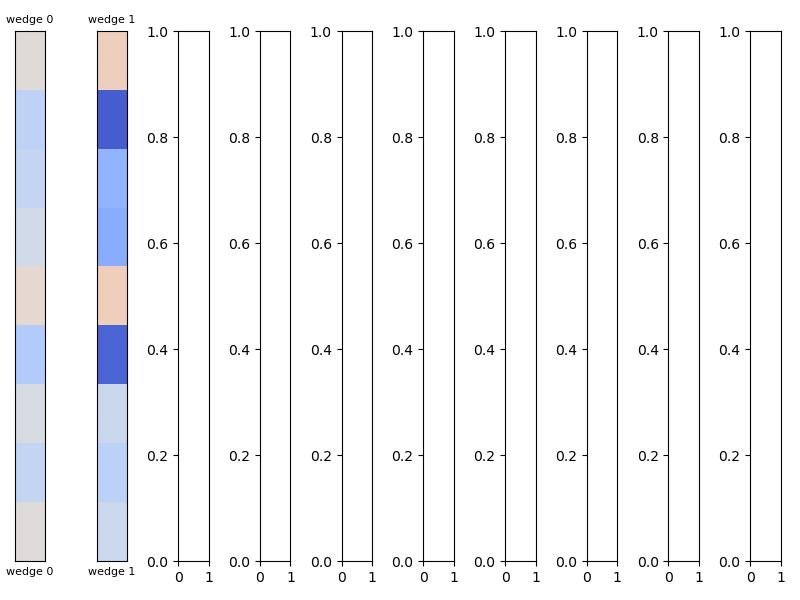

In [25]:


fig,ax = plt.subplots(1, 10, figsize=(8, 6))

for i in range(2):
    neuron_weights = models[(0,i)].params
    im = ax[i].imshow(neuron_weights[:, np.newaxis], aspect="auto", cmap="coolwarm", vmin = -0.1, vmax=0.1)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(f"wedge {i}", fontsize=8)
    ax[i].set_xlabel(f"wedge {i}", fontsize=8)

    fig.tight_layout()

100%|██████████| 138/138 [13:41<00:00,  5.96s/it]


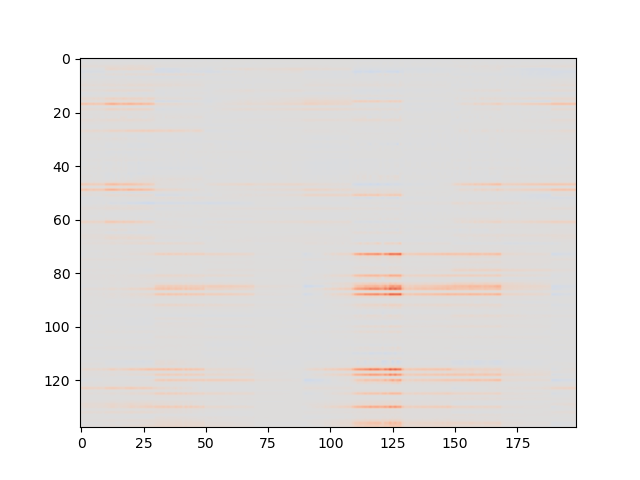

In [26]:
means_y = []
for neuron_id in tqdm(neural_labels):
    weighting=[]
    for i in (range(len(worm_angs_flat))):
        ang_bin = ang_bins[i]
        model = models[(0,ang_bin)]
        bag_weight = (slds.emissions.Cs[0] @ model.params)[neural_labels == neuron_id]
        bag_act = (slds.emissions.Cs[0] @ q_x_flat[i])[neural_labels == neuron_id]
        weighting.append( bag_act * bag_weight)


    x = np.array(worm_angs_rot_flat)
    y = np.array(weighting)
    # Define bins
    bins = np.linspace(x.min(), x.max(), 200)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Digitize x into bins and compute mean y for each bin
    inds = np.digitize(x, bins)
    mean_y = [y[inds == i].mean() if np.any(inds == i) else np.nan for i in range(1, len(bins))]
    means_y.append(mean_y)
means_y = np.array(means_y)



fig,ax = plt.subplots()
plt.imshow(means_y, aspect='auto', vmin=-0.05, vmax = 0.05, cmap='coolwarm')

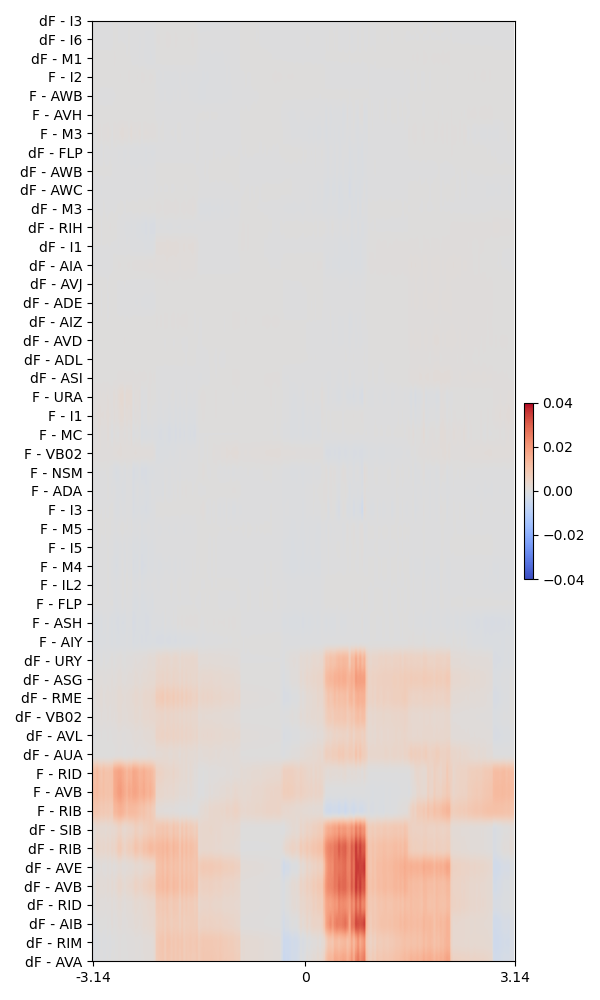

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list

# means_y is assumed to be a 2D array of shape (n_rows, n_columns)
# Step 1: Cluster rows
linked = linkage(means_y, method='ward')  # you can also try 'average', 'single', etc.
ordered_indices = leaves_list(linked)

# Step 2: Reorder rows
ordered_means_y = means_y[ordered_indices]#/mean_y_all[ordered_indices][:,np.newaxis]

# Step 3: Plot dendrogram and heatmap
fig,  ax_heatmap = plt.subplots(1, 1, figsize=(6,10))

# Heatmap
im = ax_heatmap.imshow(ordered_means_y, aspect='auto', vmin=-.04, vmax=0.04, cmap='coolwarm')
plt.colorbar(im, ax=ax_heatmap, orientation='vertical', fraction=0.02, pad=0.02)
ax_heatmap.set_yticks(np.arange(len(neural_labels)), labels=np.array(neural_labels)[ordered_indices], fontsize=10)
ax_heatmap.set_ylim(0,50)
ax_heatmap.set_xticks([0,100, 199], labels=[-3.14,0, 3.14]) 

plt.tight_layout()
plt.show()


100%|██████████| 31760/31760 [00:00<00:00, 356373.78it/s]


(-3.141592653589793, 3.141592653589793)

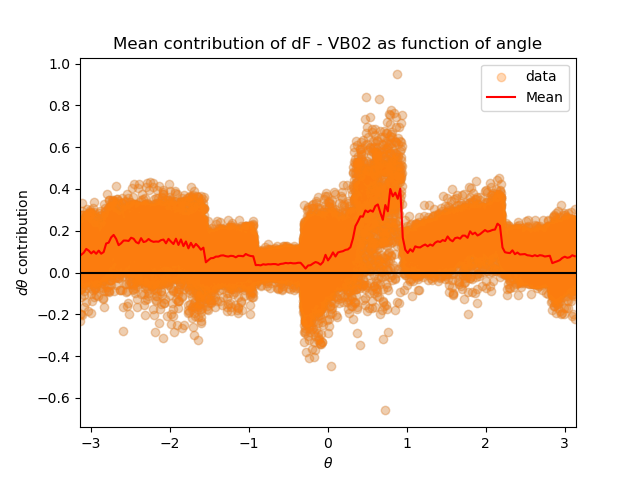

In [28]:

weighting=[]
for i in tqdm(range(len(worm_angs_flat))):
    ang_bin = ang_bins[i]
    model = models[(0,ang_bin)]
    bag_weight = q_x_flat[i] @ model.params
    weighting.append(bag_weight)



fig,ax = plt.subplots()
ax.scatter(worm_angs_rot_flat, weighting, alpha = 0.1)
x = np.array(worm_angs_rot_flat)
y = np.array(weighting)
# Define bins
bins = np.linspace(x.min(), x.max(), 200)
bin_centers = 0.5 * (bins[1:] + bins[:-1])

# Digitize x into bins and compute mean y for each bin
inds = np.digitize(x, bins)
mean_y_all = [y[inds == i].mean() if np.any(inds == i) else np.nan for i in range(1, len(bins))]
mean_y_all=np.array(mean_y_all)

# Plot
plt.scatter(x, y, alpha=0.3, label='data')
plt.plot(bin_centers, mean_y_all, color='red', label='Mean')
ax.axhline(0, color='k')
plt.xlabel(r'$\theta$')
plt.ylabel(r'$d\theta$ contribution')
plt.legend()
plt.title(f'Mean contribution of {neuron_id} as function of angle')
ax.set_xlim(-np.pi, np.pi)
# ax.set_ylim(-0.05,0.05)